In [ ]:
import gym
from gym import spaces
import numpy as np
from scipy.special import hyp2f1
import cmath
from tqdm import tqdm
import os

class StandardDeviationEnv(gym.Env):
    """
    Custom Environment for solving the crossing equation involving hypergeometric functions,
    supporting up to 4 states with individual d_i bounds and dynamic reward based on the number
    of states included in the reward.
    """
    metadata = {'render.modes': ['human']}

    def __init__(
        self,
        n_states: int = 4,  # Number of states (up to 4)
        n_states_rew: int = 4,  # Number of states to include in the reward
        min_d: list = None,  # Minimum values for each d_i
        max_d: list = None,  # Maximum values for each d_i
        d_lr: float = 0.1,  # Learning rate for d updates
        max_episode_steps: int = 50,
        num_samples: int = 20,  # Number of samples (each sample includes n_states z's)
        impr_coeff: float = 10.0,  # Coefficient for improvement term
        spins:list=[0.0, 2.0, 4.0, 0.0],
        delta_sigma=-0.4
    ):
        super(StandardDeviationEnv, self).__init__()

        assert 1 <= n_states <= 4, "n_states must be between 1 and 4"
        assert 1 <= n_states_rew <= n_states, "n_states_rew must be between 1 and n_states"

        self.n_states = n_states
        self.n_states_rew = n_states_rew
        self.d_lr = d_lr  # Learning rate for d1 to dn updates
        self.max_episode_steps = max_episode_steps
        self.num_samples = num_samples  # Number of samples, each with n_states z's
        self.impr_coeff = impr_coeff  # Improvement coefficient

        # Initialize min_d and max_d as arrays
        if min_d is None:
            self.min_d = [1.0] * self.n_states
        else:
            assert len(min_d) == self.n_states, "min_d must be a list of length n_states"
            self.min_d = min_d

        if max_d is None:
            self.max_d = [4.0] * self.n_states
        else:
            assert len(max_d) == self.n_states, "max_d must be a list of length n_states"
            self.max_d = max_d

        # Initialize variables
        self.reward = 0.0
        self.prev_reward = None  # Initialize previous reward
        self.std_over_mean_sum = None

        # Initialize d1 to dn
        self.d = np.random.uniform(self.min_d, self.max_d, size=self.n_states).tolist()

        # Action and observation spaces
        # Actions: d1_step, d2_step, ..., dn_step
        action_low = np.array([-1.0] * self.n_states, dtype=np.float32)
        action_high = np.array([1.0] * self.n_states, dtype=np.float32)

        # Observations: d1, d2, ..., dn, mean_C1, mean_C2, ..., mean_C_rew, std_over_mean_sum
        obs_low = np.array(
            self.min_d + [-np.inf] * self.n_states_rew + [0.0],
            dtype=np.float32
        )
        obs_high = np.array(
            self.max_d + [np.inf] * self.n_states_rew + [np.inf],
            dtype=np.float32
)

        self.action_space = spaces.Box(low=action_low, high=action_high, dtype=np.float32)
        self.observation_space = spaces.Box(low=obs_low, high=obs_high, dtype=np.float32)

        # Count steps
        self.num_steps = 0

        # Fixed parameters (set these to your actual values)
        self.Delta_sigma = delta_sigma   # Δσ
        self.s = spins  # Spins for operators 1 to 4

        # Initialize state variables
        self.reset()

    # Sampling functions
    def zcomplex(self, r, theta):
        return 0.5 + r * cmath.exp(1j * (cmath.pi - theta))

    def sample_z(self, state_idx):
        """
        Sample a single z complex number based on the specified distribution.
        Allows for different sampling strategies per state if desired.

        Args:
            state_idx (int): Index of the current state (0-based).

        Returns:
            complex: Sampled complex number z.
        """
        if state_idx % 2 == 0:
            # For even-indexed states, use one sampling method
            r = 0.2 * np.sqrt(np.random.rand())
            theta = np.random.rand() * (7 * np.pi / 40)
        else:
            # For odd-indexed states, use a different sampling method
            r_squared = np.random.rand() * (((35 / 100) ** 2) - ((3 / 10) ** 2)) + ((3 / 10) ** 2)
            r = np.sqrt(r_squared)
            theta = 1 + np.random.rand() * (np.pi / 2 - 1)
        z = self.zcomplex(r, theta)
        return z

    def kronecker_delta(self, h, hb, tol=1e-8):
        return 1.0 if abs(h - hb) < tol else 0.0

    def g(self, h, hb, z):
        delta = self.kronecker_delta(h, hb)
        denominator = delta + 1.0

        # Compute hypergeometric functions using scipy
        z_conj = np.conj(z)

        try:
            hg_h_z = hyp2f1(h, h, 2 * h, z)
            hg_hb_z_conj = hyp2f1(hb, hb, 2 * hb, z_conj)
            hg_h_z_conj = hyp2f1(h, h, 2 * h, z_conj)
            hg_hb_z = hyp2f1(hb, hb, 2 * hb, z)
        except Exception as e:
            print(f"Error computing hypergeometric functions for z={z}: {e}")
            return 0.0

        # Compute terms
        term1 = (z ** h) * (z_conj ** hb) * hg_h_z * hg_hb_z_conj
        term2 = (z_conj ** h) * (z ** hb) * hg_h_z_conj * hg_hb_z

        # Combine terms
        result = (term1 + term2) / denominator
        return result.real  # Assuming the result should be real

    def compute_equation(self, z_list, d_values):
        """
        Compute the crossing equations for a given list of z's and d's.

        Args:
            z_list (list of complex): List of z complex numbers.
            d_values (list of float): List of d_i values for each state.

        Returns:
            tuple: (A_matrix, D_vector) where A_matrix is [num_equations x n_states] and D_vector is [num_equations]
        """
        num_equations = len(z_list)  # Typically, num_equations = n_states
        n = self.n_states
        A = np.zeros((num_equations, n), dtype=np.float64)
        D = np.zeros(num_equations, dtype=np.float64)

        for eq_idx, z in enumerate(z_list):
            # Define h[i] and hb[i] for all states
            for i in range(n):
                Delta_i = d_values[i]
                s_i = self.s[i]
                h_i = (Delta_i + s_i) / 2
                hb_i = (Delta_i - s_i) / 2

                # Compute g functions for z and 1 - z
                g_z = self.g(h_i, hb_i, z)
                g_1_minus_z = self.g(h_i, hb_i, 1 - z)

                # Compute Abs[z - 1]^(2 Delta_sigma) and Abs[z]^(2 Delta_sigma)
                abs_z_minus_1 = abs(z - 1) ** (2 * self.Delta_sigma)
                abs_z = abs(z) ** (2 * self.Delta_sigma)

                # Compute coefficient for C[i] in this equation
                coefficient = abs_z_minus_1 * g_z - abs_z * g_1_minus_z

                A[eq_idx, i] = coefficient

            # Compute D for this equation
            D[eq_idx] = - (abs(z - 1) ** (2 * self.Delta_sigma) - abs(z) ** (2 * self.Delta_sigma))

        return A, D


    def compute_reward(self, d_values):
        """
        Calculate the reward based on the current d_values.

        Args:
            d_values (list of float): Current d_i values.

        Returns:
            float: Calculated reward.
        """
        cs_list = []  # To collect C estimates from each sample

        for _ in range(self.num_samples):
            # Sample z's for each equation
            z_samples = [self.sample_z(state_idx) for state_idx in range(self.n_states)]

            # Compute A and D for the current sample
            A, D = self.compute_equation(z_samples, d_values)

            # Solve the linear system A * C = D
            try:
                C = np.linalg.solve(A, D)
                cs_list.append(C)
            except np.linalg.LinAlgError as e:
                # Singular matrix or other numerical issues; skip this sample
                continue

        if len(cs_list) == 0:
            # No valid solutions found; assign a low reward
            self.cs = np.zeros(self.n_states_rew)
            self.std_over_mean_sum = 1e6
            return -1e6
        else:
            cs_array = np.array(cs_list)
            C_means = np.mean(cs_array, axis=0)
            C_stds = np.std(cs_array, axis=0, ddof=1)

            # Select the first n_states_rew states
            selected_means = C_means[:self.n_states_rew]
            selected_stds = C_stds[:self.n_states_rew]

            # Compute the standard deviation over mean sum
            epsilon = 1e-8
            selected_means_safe = np.where(np.abs(selected_means) < epsilon, epsilon, np.abs(selected_means))
            std_over_mean = selected_stds / selected_means_safe
            self.std_over_mean_sum = np.sum(std_over_mean)

            # Compute the reward
            # Reward = - sum(log(std_over_mean)) for the selected states
            # Ensure std_over_mean > 0 to avoid log(0)
            std_over_mean = np.clip(std_over_mean, 1e-8, None)
            reward = -np.sum(np.log(std_over_mean))

            self.cs = C_means[:self.n_states_rew]

            return reward


    def _get_obs(self):
        """
        Construct the observation array.

        Returns:
            np.array: Observation containing d1 to dn, mean_C1 to Cn, std_over_mean_sum
        """
        d_array = np.array(self.d, dtype=np.float32)
        C_mean_array = self.cs if hasattr(self, 'cs') else np.zeros(self.n_states_rew, dtype=np.float32)
        observation = np.concatenate([d_array, C_mean_array, [self.std_over_mean_sum]], axis=0).astype(np.float32)
        return observation

    def reset(self):
        self.num_steps = 0
        self.prev_reward = None  # Reset previous reward

        # Initialize d1 to dn randomly within bounds
        self.d = np.random.uniform(self.min_d, self.max_d, size=self.n_states).tolist()

        # Compute initial reward and observation
        self.reward = self.compute_reward(self.d)

        # Set prev_reward to the initial immediate reward
        self.prev_reward = self.reward

        observation = self._get_obs()
        return observation

    def step(self, action):
        self.num_steps += 1

        # Clip the action to ensure it's within the action space
        action = np.clip(action, self.action_space.low, self.action_space.high)
        d_new = self.d + self.d_lr * action  # Update rule

        # Check boundary conditions
        is_ok = self.d_bc(d_new)

        done = False

        if not is_ok:
            # Penalize the agent for invalid values
            self.reward = -10.0
            done = True
            observation = self._get_obs()
            return observation, self.reward, done, {}

        # Update variables
        self.d = d_new.tolist()

        # Compute the immediate reward
        current_reward = self.compute_reward(self.d)

        # Calculate the change in immediate reward
        if self.prev_reward is not None:
            delta_reward = current_reward - self.prev_reward
        else:
            delta_reward = 0.0

        # Compute the total reward
        self.reward = current_reward + self.impr_coeff * delta_reward

        # Update the previous reward
        self.prev_reward = current_reward

        # Check if episode should be truncated due to max steps
        if self.num_steps >= self.max_episode_steps:
            done = True

        # Check for NaNs in observation
        observation = self._get_obs()
        if np.isnan(observation).any():
            self.reward = -10.0
            done = True
            return observation, self.reward, done, {}

        return observation, self.reward, done, {}

    def d_bc(self, d_values):
        """
        Check if all d_i values are within the specified bounds.

        Args:
            d_values (list of float): Current d_i values.

        Returns:
            bool: True if all d_i are within bounds, False otherwise.
        """
        return all(self.min_d[i] <= d_values[i] <= self.max_d[i] for i in range(self.n_states))

    def render(self, mode='human'):
        """
        Render the environment.
        """
        print(f"Step: {self.num_steps}")
        for i in range(self.n_states):
            print(f"d{i+1}: {self.d[i]:.4f}")
        for i in range(self.n_states_rew):
            print(f"C{i+1}_mean: {self.cs[i]:.4f}")
        print(f"Std over Mean Sum: {self.std_over_mean_sum:.4f}")
        print(f"Reward: {self.reward:.4f}")
        print("-" * 30)

    def close(self):
        pass


In [25]:
env = StandardDeviationEnv()



In [136]:
vals=np.array([env.compute_reward([-.4,2,3.6,7.6]) for i in range(20)])

In [137]:
np.mean(vals)

13.007491599740018

In [138]:
np.std(vals)

2.8628309014831492

In [273]:
env.compute_reward([-0.5299291610717773, 1.9137884378433228, 3.3682453632354736,
7.221731185913086])

-2.4400058816315022

In [265]:
env.compute_reward([-.4,2,3.6,7.6])

12.08814682111027

ising

In [ ]:
{1, 2, 4, 6}, {0, 2, 0, 6}, 4/10, 49/100, 1/8, 30]

In [367]:
[env.sample_z(i) for i in range(80)]

[(0.33991855072593896+0.009120811605038992j),
 (0.4479317435927501+0.3332602036873727j),
 (0.3313606153070749+0.08893805255512283j),
 (0.4870245345441848+0.345396985284971j),
 (0.34452530696896383+0.07593746572536138j),
 (0.4270729300211247+0.30044956363579733j),
 (0.4660427022841916+0.0037328107392406657j),
 (0.4428095378988895+0.32037957671224626j),
 (0.4028300155799515+0.00466332970672254j),
 (0.40751577782174975+0.2948520555545184j),
 (0.39517938578318423+0.024581274166913976j),
 (0.44255155055450124+0.33493599261864726j),
 (0.42721021098863105+0.006446516721407273j),
 (0.3308539759324897+0.3063645404089619j),
 (0.4095919273443319+0.015210026544854044j),
 (0.3712956380701379+0.27884266117321316j),
 (0.3156754491343662+0.05124163467558722j),
 (0.313301240232927+0.2957471833496594j),
 (0.3699094546466398+0.060109643683488236j),
 (0.4273689526197979+0.33273630665676224j),
 (0.3167865846915863+0.04841714188641773j),
 (0.3220057239680192+0.2969247277816467j),
 (0.40266114196865904+0.053

In [358]:
env = StandardDeviationEnv(
    n_states=4,
    n_states_rew=4,
    min_d=[-1.0, 1.5, 3.1, 5.5],  # Adjusted to include d1=-0.4 and d4=7.6
    max_d=[1.0, 2.5, 5.0, 7.0],    # Ensure that d1=-0.4 and d4=7.6 are within min_d and max_d
    spins=[0, 2, 0, 4,6],
    delta_sigma=1/8
)

In [413]:
env.compute_reward([1.0, 2.0, 4.0,4.0])

19.512835260746616

In [360]:
vals=np.array([env.compute_reward([1.0, 2.0, 4.0,4.0, 6.0]) for _ in range(100)])

In [361]:
np.mean(vals)

15.490202671888474

In [347]:
vals1=np.array([env.compute_reward([1.2, 2.3, 4.0, 6.0]) for _ in range(100)])

In [348]:
np.mean(vals1)

5.243801551363394

In [362]:
env.cs

array([0.25009331, 0.01554254, 0.00029189, 0.00026479])

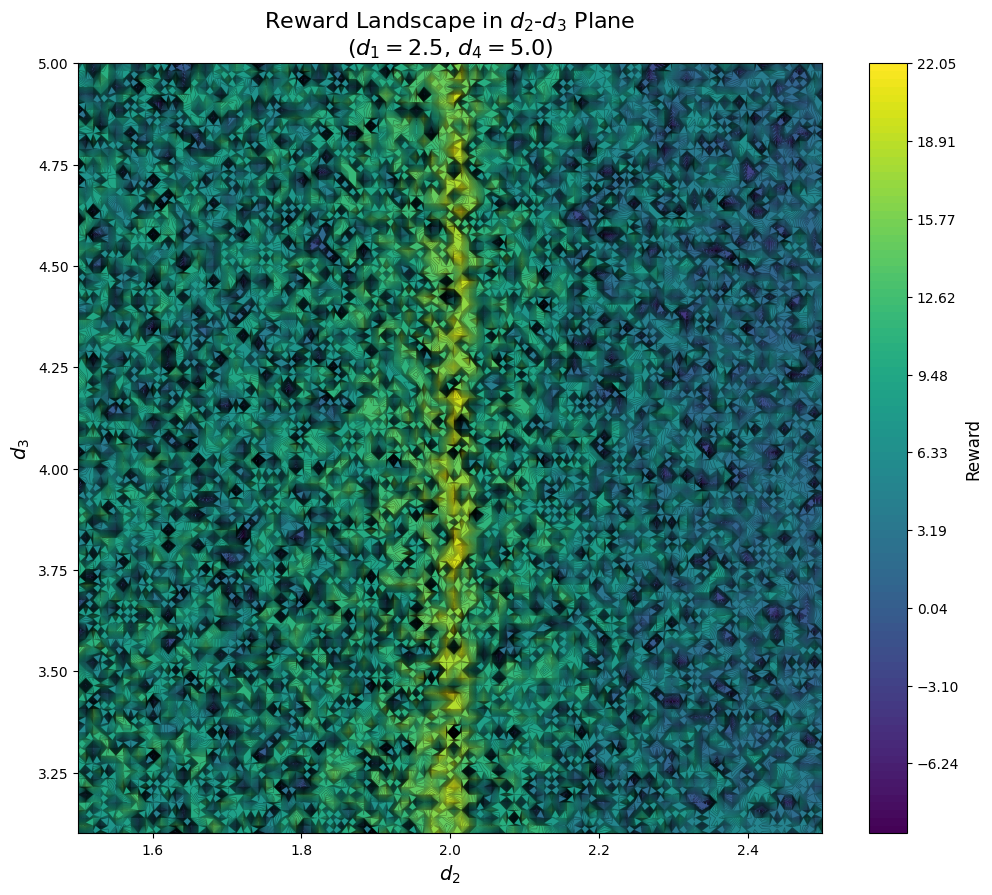

Maximum Reward: 22.054055152606978
Optimal d2: 2.015151515151515
Optimal d3: 4.635353535353535


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm  # For color maps

# Assume StandardDeviationEnv is already defined and imported



# Fixed parameters
d1_fixed =1
d4_fixed =4

# Ranges for d2 and d3
d2_min, d2_max = 1.5, 2.5
d3_min, d3_max = 3.1, 5.0

# Number of points in each dimension for the grid
num_points = 100

# Create a grid of d2 and d3 values
d2_values = np.linspace(d2_min, d2_max, num_points)
d3_values = np.linspace(d3_min, d3_max, num_points)
d2_grid, d3_grid = np.meshgrid(d2_values, d3_values)

# Initialize a 2D array to store rewards
reward_grid = np.zeros_like(d2_grid)

# Iterate over the grid and compute rewards
for i in range(num_points):
    for j in range(num_points):
        d2 = d2_grid[i, j]
        d3 = d3_grid[i, j]
        # Set d1 and d4 to fixed values
        d_values = [d1_fixed, d2, d3, d4_fixed]
        # Compute the reward
        reward = env.compute_reward(d_values)
        reward_grid[i, j] = reward

# Create the plot
plt.figure(figsize=(12, 10))

# Define contour levels
levels = np.linspace(np.min(reward_grid), np.max(reward_grid), 100)

# Create a contour plot
contour = plt.contourf(d2_grid, d3_grid, reward_grid, levels=levels, cmap=cm.viridis)

# Add a color bar
cbar = plt.colorbar(contour)
cbar.set_label('Reward', fontsize=12)

# Add labels and title
plt.xlabel('$d_2$', fontsize=14)
plt.ylabel('$d_3$', fontsize=14)
plt.title('Reward Landscape in $d_2$-$d_3$ Plane\n($d_1 = {}$, $d_4 = {}$)'.format(d1_fixed,d4_fixed), fontsize=16)

# Optional: Add contour lines
plt.contour(d2_grid, d3_grid, reward_grid, levels=levels, colors='k', linewidths=0.5, alpha=0.3)

# Show the plot
plt.show()
# Find the (i, j) indices of the maximum reward
max_reward_index = np.argmax(reward_grid)
max_i, max_j = np.unravel_index(max_reward_index, reward_grid.shape)

# Retrieve the corresponding d2 and d3 values
optimal_d2 = d2_grid[max_i, max_j]
optimal_d3 = d3_grid[max_i, max_j]
max_reward = reward_grid[max_i, max_j]

print(f"Maximum Reward: {max_reward}")
print(f"Optimal d2: {optimal_d2}")
print(f"Optimal d3: {optimal_d3}")



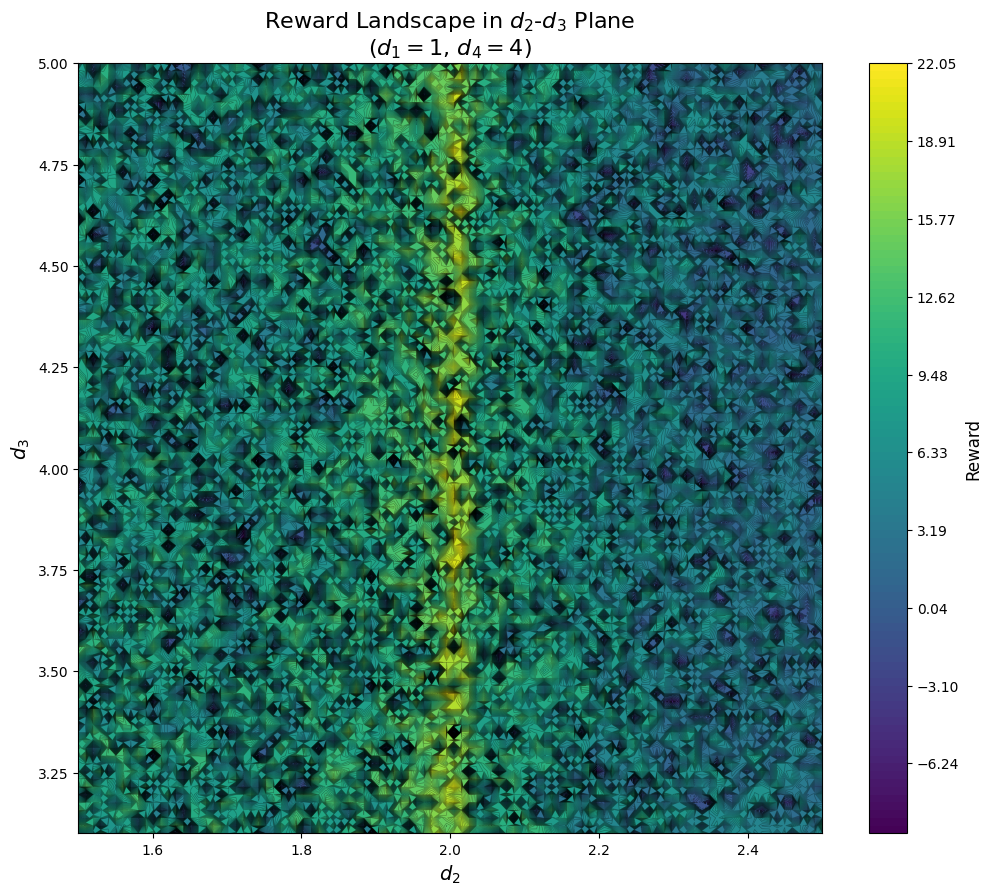

Maximum Reward: 22.054055152606978
Optimal d2: 2.015151515151515
Optimal d3: 4.635353535353535


In [365]:
# Create the plot
plt.figure(figsize=(12, 10))

# Define contour levels
levels = np.linspace(np.min(reward_grid), np.max(reward_grid), 100)

# Create a contour plot
contour = plt.contourf(d2_grid, d3_grid, reward_grid, levels=levels, cmap=cm.viridis)

# Add a color bar
cbar = plt.colorbar(contour)
cbar.set_label('Reward', fontsize=12)

# Add labels and title
plt.xlabel('$d_2$', fontsize=14)
plt.ylabel('$d_3$', fontsize=14)
plt.title('Reward Landscape in $d_2$-$d_3$ Plane\n($d_1 = {}$, $d_4 = {}$)'.format(d1_fixed,d4_fixed), fontsize=16)

# Optional: Add contour lines
plt.contour(d2_grid, d3_grid, reward_grid, levels=levels, colors='k', linewidths=0.5, alpha=0.3)

# Show the plot
plt.show()
# Find the (i, j) indices of the maximum reward
max_reward_index = np.argmax(reward_grid)
max_i, max_j = np.unravel_index(max_reward_index, reward_grid.shape)

# Retrieve the corresponding d2 and d3 values
optimal_d2 = d2_grid[max_i, max_j]
optimal_d3 = d3_grid[max_i, max_j]
max_reward = reward_grid[max_i, max_j]

print(f"Maximum Reward: {max_reward}")
print(f"Optimal d2: {optimal_d2}")
print(f"Optimal d3: {optimal_d3}")


yl

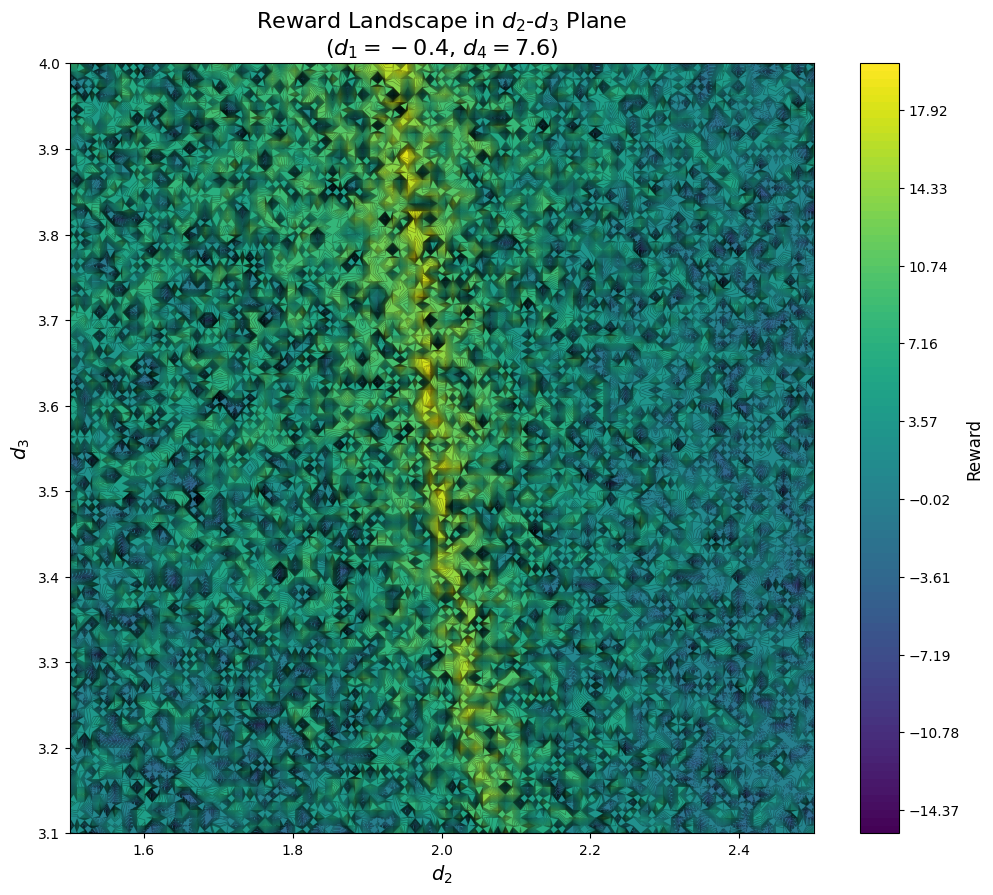

Maximum Reward: 20.07262832795732
Optimal d2: 1.9646464646464648
Optimal d3: 3.772727272727273


In [204]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm  # For color maps

# Assume StandardDeviationEnv is already defined and imported

# Initialize the environment with adjusted min_d and max_d to include d1=-0.4 and d4=7.6
env = StandardDeviationEnv(
    n_states=4,
    n_states_rew=4,
    min_d=[-1.0, 1.5, 3.1, 7.0],  # Adjusted to include d1=-0.4 and d4=7.6
    max_d=[1.0, 2.5, 4.0, 8.0]    # Ensure that d1=-0.4 and d4=7.6 are within min_d and max_d
)

# Fixed parameters
d1_fixed = -0.4
d4_fixed = 7.6

# Ranges for d2 and d3
d2_min, d2_max = 1.5, 2.5
d3_min, d3_max = 3.1, 4.0

# Number of points in each dimension for the grid
num_points = 100

# Create a grid of d2 and d3 values
d2_values = np.linspace(d2_min, d2_max, num_points)
d3_values = np.linspace(d3_min, d3_max, num_points)
d2_grid, d3_grid = np.meshgrid(d2_values, d3_values)

# Initialize a 2D array to store rewards
reward_grid = np.zeros_like(d2_grid)

# Iterate over the grid and compute rewards
for i in range(num_points):
    for j in range(num_points):
        d2 = d2_grid[i, j]
        d3 = d3_grid[i, j]
        # Set d1 and d4 to fixed values
        d_values = [d1_fixed, d2, d3, d4_fixed]
        # Compute the reward
        reward = env.compute_reward(d_values)
        reward_grid[i, j] = reward

# Create the plot
plt.figure(figsize=(12, 10))

# Define contour levels
levels = np.linspace(np.min(reward_grid), np.max(reward_grid), 100)

# Create a contour plot
contour = plt.contourf(d2_grid, d3_grid, reward_grid, levels=levels, cmap=cm.viridis)

# Add a color bar
cbar = plt.colorbar(contour)
cbar.set_label('Reward', fontsize=12)

# Add labels and title
plt.xlabel('$d_2$', fontsize=14)
plt.ylabel('$d_3$', fontsize=14)
plt.title('Reward Landscape in $d_2$-$d_3$ Plane\n($d_1 = -0.4$, $d_4 = 7.6$)', fontsize=16)

# Optional: Add contour lines
plt.contour(d2_grid, d3_grid, reward_grid, levels=levels, colors='k', linewidths=0.5, alpha=0.3)

# Show the plot
plt.show()
# Find the (i, j) indices of the maximum reward
max_reward_index = np.argmax(reward_grid)
max_i, max_j = np.unravel_index(max_reward_index, reward_grid.shape)

# Retrieve the corresponding d2 and d3 values
optimal_d2 = d2_grid[max_i, max_j]
optimal_d3 = d3_grid[max_i, max_j]
max_reward = reward_grid[max_i, max_j]

print(f"Maximum Reward: {max_reward}")
print(f"Optimal d2: {optimal_d2}")
print(f"Optimal d3: {optimal_d3}")



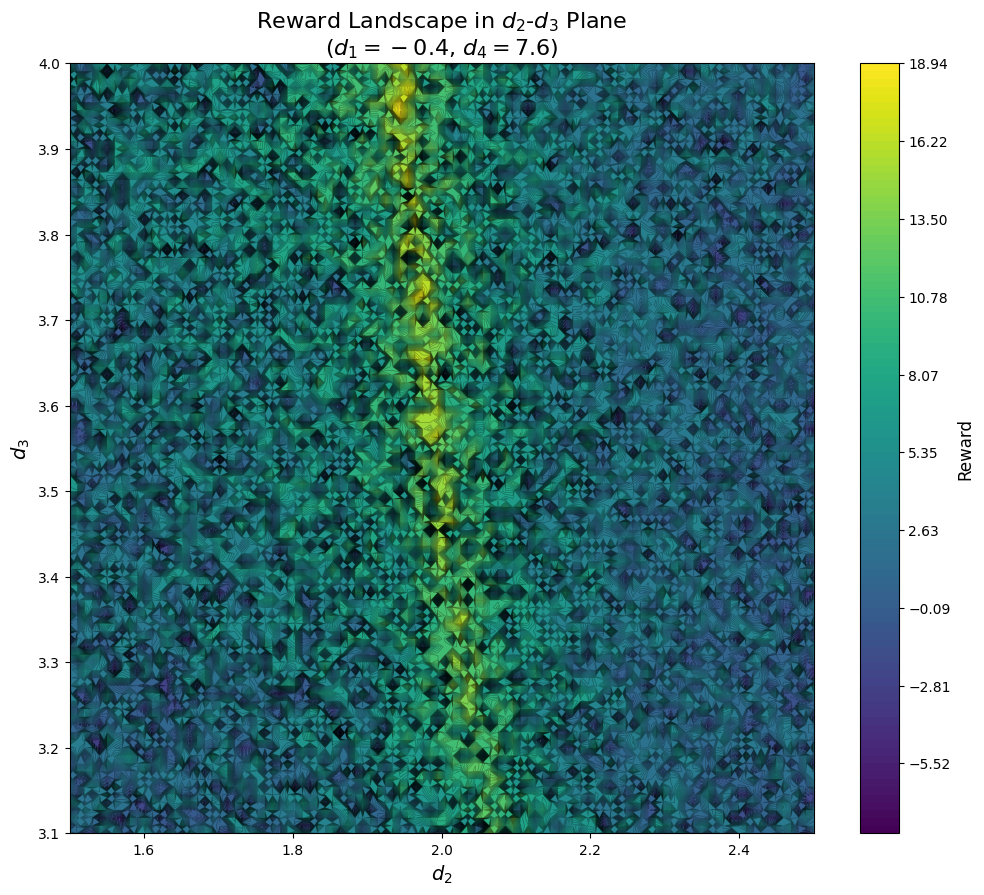

Maximum Reward: 18.936624517627102
Optimal d2: 1.9444444444444444
Optimal d3: 3.9545454545454546


In [203]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm  # For color maps

# Assume StandardDeviationEnv is already defined and imported

# Initialize the environment with adjusted min_d and max_d to include d1=-0.4 and d4=7.6
env = StandardDeviationEnv(
    n_states=4,
    n_states_rew=3,
    min_d=[-1.0, 1.5, 3.1, 7.0],  # Adjusted to include d1=-0.4 and d4=7.6
    max_d=[1.0, 2.5, 4.0, 8.0]    # Ensure that d1=-0.4 and d4=7.6 are within min_d and max_d
)

# Fixed parameters
d1_fixed = -0.4
d4_fixed = 7.6

# Ranges for d2 and d3
d2_min, d2_max = 1.5, 2.5
d3_min, d3_max = 3.1, 4.0

# Number of points in each dimension for the grid
num_points = 100

# Create a grid of d2 and d3 values
d2_values = np.linspace(d2_min, d2_max, num_points)
d3_values = np.linspace(d3_min, d3_max, num_points)
d2_grid, d3_grid = np.meshgrid(d2_values, d3_values)

# Initialize a 2D array to store rewards
reward_grid = np.zeros_like(d2_grid)

# Iterate over the grid and compute rewards
for i in range(num_points):
    for j in range(num_points):
        d2 = d2_grid[i, j]
        d3 = d3_grid[i, j]
        # Set d1 and d4 to fixed values
        d_values = [d1_fixed, d2, d3, d4_fixed]
        # Compute the reward
        reward = env.compute_reward(d_values)
        reward_grid[i, j] = reward

# Create the plot
plt.figure(figsize=(12, 10))

# Define contour levels
levels = np.linspace(np.min(reward_grid), np.max(reward_grid), 100)

# Create a contour plot
contour = plt.contourf(d2_grid, d3_grid, reward_grid, levels=levels, cmap=cm.viridis)

# Add a color bar
cbar = plt.colorbar(contour)
cbar.set_label('Reward', fontsize=12)

# Add labels and title
plt.xlabel('$d_2$', fontsize=14)
plt.ylabel('$d_3$', fontsize=14)
plt.title('Reward Landscape in $d_2$-$d_3$ Plane\n($d_1 = -0.4$, $d_4 = 7.6$)', fontsize=16)

# Optional: Add contour lines
plt.contour(d2_grid, d3_grid, reward_grid, levels=levels, colors='k', linewidths=0.5, alpha=0.3)

# Show the plot
plt.show()
# Find the (i, j) indices of the maximum reward
max_reward_index = np.argmax(reward_grid)
max_i, max_j = np.unravel_index(max_reward_index, reward_grid.shape)

# Retrieve the corresponding d2 and d3 values
optimal_d2 = d2_grid[max_i, max_j]
optimal_d3 = d3_grid[max_i, max_j]
max_reward = reward_grid[max_i, max_j]

print(f"Maximum Reward: {max_reward}")
print(f"Optimal d2: {optimal_d2}")
print(f"Optimal d3: {optimal_d3}")



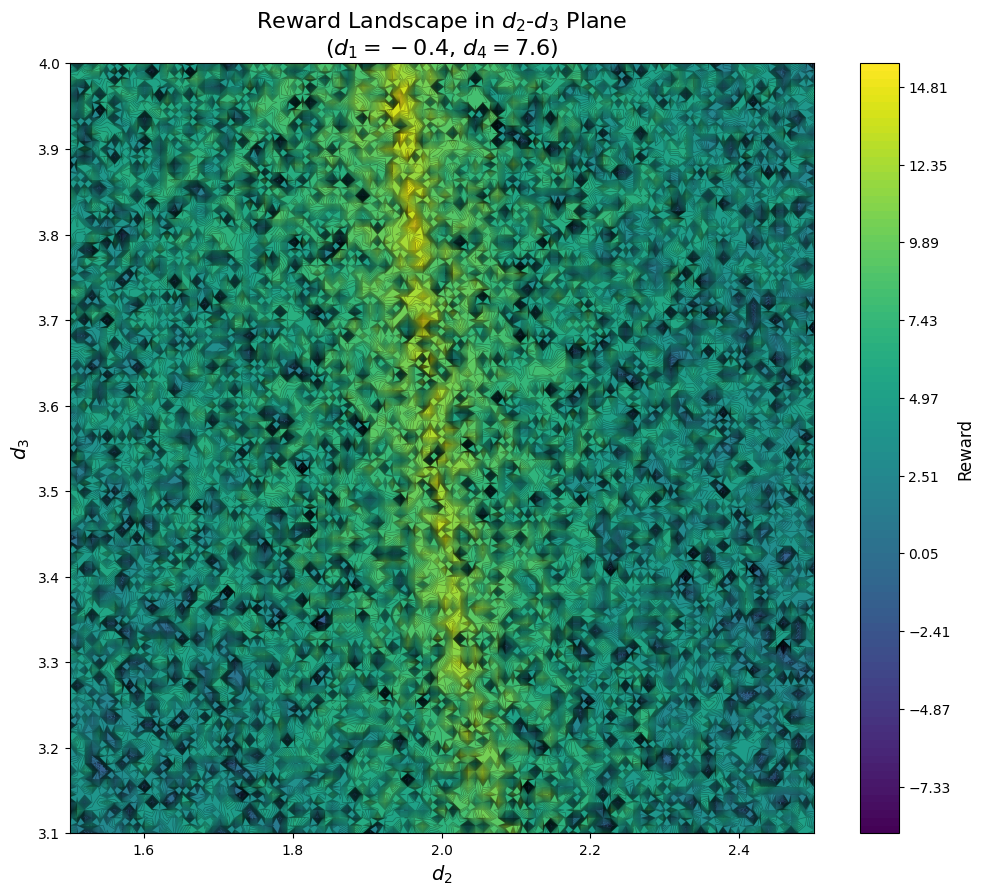

Maximum Reward: 15.546964790072948
Optimal d2: 1.974747474747475
Optimal d3: 3.7


In [202]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm  # For color maps

# Assume StandardDeviationEnv is already defined and imported

# Initialize the environment with adjusted min_d and max_d to include d1=-0.4 and d4=7.6
env = StandardDeviationEnv(
    n_states=4,
    n_states_rew=2,
    min_d=[-1.0, 1.5, 3.1, 7.0],  # Adjusted to include d1=-0.4 and d4=7.6
    max_d=[1.0, 2.5, 4.0, 8.0]    # Ensure that d1=-0.4 and d4=7.6 are within min_d and max_d
)

# Fixed parameters
d1_fixed = -0.4
d4_fixed = 7.6

# Ranges for d2 and d3
d2_min, d2_max = 1.5, 2.5
d3_min, d3_max = 3.1, 4.0

# Number of points in each dimension for the grid
num_points = 100

# Create a grid of d2 and d3 values
d2_values = np.linspace(d2_min, d2_max, num_points)
d3_values = np.linspace(d3_min, d3_max, num_points)
d2_grid, d3_grid = np.meshgrid(d2_values, d3_values)

# Initialize a 2D array to store rewards
reward_grid = np.zeros_like(d2_grid)

# Iterate over the grid and compute rewards
for i in range(num_points):
    for j in range(num_points):
        d2 = d2_grid[i, j]
        d3 = d3_grid[i, j]
        # Set d1 and d4 to fixed values
        d_values = [d1_fixed, d2, d3, d4_fixed]
        # Compute the reward
        reward = env.compute_reward(d_values)
        reward_grid[i, j] = reward

# Create the plot
plt.figure(figsize=(12, 10))

# Define contour levels
levels = np.linspace(np.min(reward_grid), np.max(reward_grid), 100)

# Create a contour plot
contour = plt.contourf(d2_grid, d3_grid, reward_grid, levels=levels, cmap=cm.viridis)

# Add a color bar
cbar = plt.colorbar(contour)
cbar.set_label('Reward', fontsize=12)

# Add labels and title
plt.xlabel('$d_2$', fontsize=14)
plt.ylabel('$d_3$', fontsize=14)
plt.title('Reward Landscape in $d_2$-$d_3$ Plane\n($d_1 = -0.4$, $d_4 = 7.6$)', fontsize=16)

# Optional: Add contour lines
plt.contour(d2_grid, d3_grid, reward_grid, levels=levels, colors='k', linewidths=0.5, alpha=0.3)

# Show the plot
plt.show()
# Find the (i, j) indices of the maximum reward
max_reward_index = np.argmax(reward_grid)
max_i, max_j = np.unravel_index(max_reward_index, reward_grid.shape)

# Retrieve the corresponding d2 and d3 values
optimal_d2 = d2_grid[max_i, max_j]
optimal_d3 = d3_grid[max_i, max_j]
max_reward = reward_grid[max_i, max_j]

print(f"Maximum Reward: {max_reward}")
print(f"Optimal d2: {optimal_d2}")
print(f"Optimal d3: {optimal_d3}")



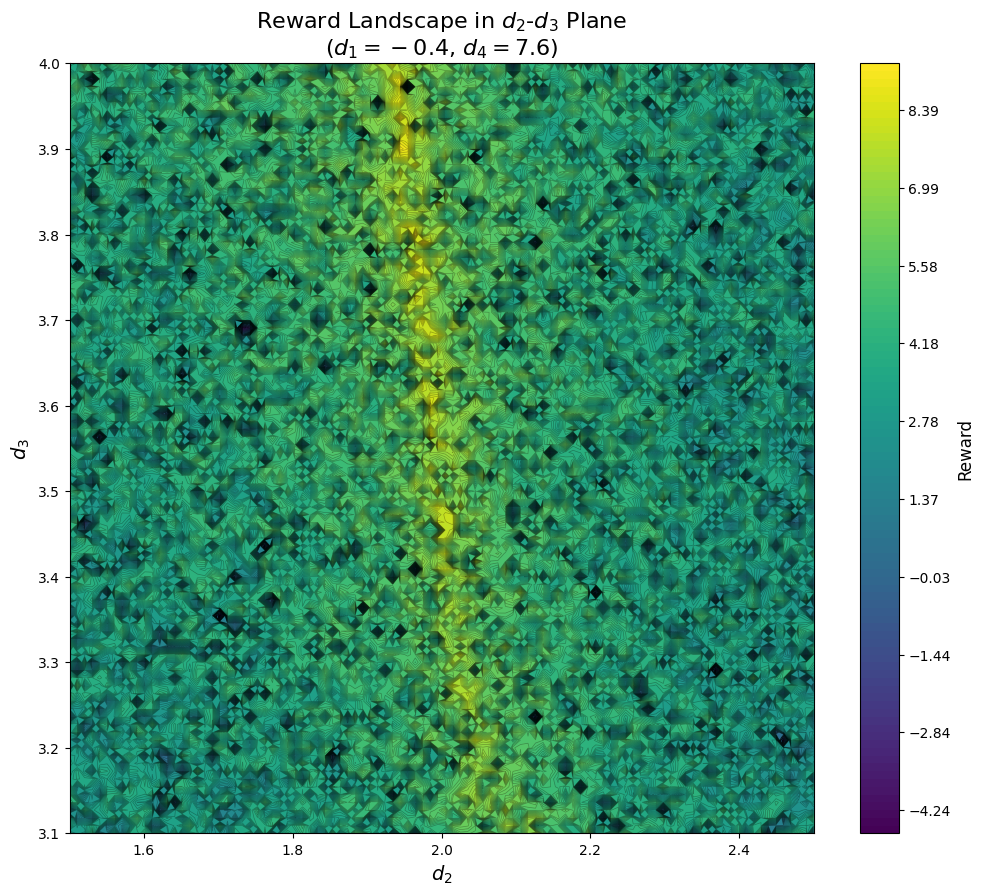

In [194]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm  # For color maps

# Assume StandardDeviationEnv is already defined and imported

# Initialize the environment with adjusted min_d and max_d to include d1=-0.4 and d4=7.6
env = StandardDeviationEnv(
    n_states=4,
    n_states_rew=1,
    min_d=[-1.0, 1.5, 3.1, 7.0],  # Adjusted to include d1=-0.4 and d4=7.6
    max_d=[1.0, 2.5, 4.0, 8.0]    # Ensure that d1=-0.4 and d4=7.6 are within min_d and max_d
)

# Fixed parameters
d1_fixed = -0.4
d4_fixed = 7.6

# Ranges for d2 and d3
d2_min, d2_max = 1.5, 2.5
d3_min, d3_max = 3.1, 4.0

# Number of points in each dimension for the grid
num_points = 100

# Create a grid of d2 and d3 values
d2_values = np.linspace(d2_min, d2_max, num_points)
d3_values = np.linspace(d3_min, d3_max, num_points)
d2_grid, d3_grid = np.meshgrid(d2_values, d3_values)

# Initialize a 2D array to store rewards
reward_grid = np.zeros_like(d2_grid)

# Iterate over the grid and compute rewards
for i in range(num_points):
    for j in range(num_points):
        d2 = d2_grid[i, j]
        d3 = d3_grid[i, j]
        # Set d1 and d4 to fixed values
        d_values = [d1_fixed, d2, d3, d4_fixed]
        # Compute the reward
        reward = env.compute_reward(d_values)
        reward_grid[i, j] = reward

# Create the plot
plt.figure(figsize=(12, 10))

# Define contour levels
levels = np.linspace(np.min(reward_grid), np.max(reward_grid), 100)

# Create a contour plot
contour = plt.contourf(d2_grid, d3_grid, reward_grid, levels=levels, cmap=cm.viridis)

# Add a color bar
cbar = plt.colorbar(contour)
cbar.set_label('Reward', fontsize=12)

# Add labels and title
plt.xlabel('$d_2$', fontsize=14)
plt.ylabel('$d_3$', fontsize=14)
plt.title('Reward Landscape in $d_2$-$d_3$ Plane\n($d_1 = -0.4$, $d_4 = 7.6$)', fontsize=16)

# Optional: Add contour lines
plt.contour(d2_grid, d3_grid, reward_grid, levels=levels, colors='k', linewidths=0.5, alpha=0.3)

# Show the plot
plt.show()


In [201]:
# Find the (i, j) indices of the maximum reward
max_reward_index = np.argmax(reward_grid)
max_i, max_j = np.unravel_index(max_reward_index, reward_grid.shape)

# Retrieve the corresponding d2 and d3 values
optimal_d2 = d2_grid[max_i, max_j]
optimal_d3 = d3_grid[max_i, max_j]
max_reward = reward_grid[max_i, max_j]

print(f"Maximum Reward: {max_reward}")
print(f"Optimal d2: {optimal_d2}")
print(f"Optimal d3: {optimal_d3}")


Maximum Reward: 9.233549101317092
Optimal d2: 1.9646464646464648
Optimal d3: 3.8


In [200]:
optimal_d3

3.8

In [195]:
np.max(reward_grid)

9.233549101317092

In [ ]:
d2_grid

In [196]:
np.unravel_index(np.argmax(reward_grid), reward_grid.shape)

(77, 46)

In [186]:
np.mean(np.array([env.compute_reward([-.4,2,3.6,7.6]) for i in range(100)]))

11.448311989345054

In [192]:
np.mean(np.array([env.compute_reward([-.4,2,3.3,7.6]) for i in range(100)]))

9.132986609653972

In [209]:

from stable_baselines3 import SAC
from stable_baselines3.common.env_checker import check_env
import matplotlib.pyplot as plt

# Assuming the StandardDeviationEnv class is defined in the same script or imported appropriately

# Initialize the environment
env = StandardDeviationEnv(
    n_states=4,
    n_states_rew=2,
    min_d=[-1.0, 1.5, 3.1, 7.0],  # Adjusted to include d1=-0.4 and d4=7.6
    max_d=[-0.1, 2.5, 4.0, 8.0],
    impr_coeff=100# Ensure that d1=-0.4 and d4=7.6 are within min_d and max_d
)



# Create the RL model
model = SAC(
    'MlpPolicy',
    env,
    verbose=1,
    tensorboard_log="./sac_standard_deviation_tensorboard/",
    # You can adjust hyperparameters here
    learning_rate=3e-4,
    buffer_size=1000000,
    learning_starts=10000,
    batch_size=256,
    tau=0.005,
    gamma=0.99,
    train_freq=1,
    gradient_steps=1,
    ent_coef='auto',
    target_update_interval=1,
)

# Train the agent
# Adjust the total_timesteps based on computational resources
model.learn(total_timesteps=1000000)

# Save the trained model
model.save("sac_standard_deviation_cft_4states")

# To load the model later:
# model = PPO.load("ppo_standard_deviation")


Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Logging to ./sac_standard_deviation_tensorboard/SAC_5
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 8        |
|    ep_rew_mean     | -36.4    |
| time/              |          |
|    episodes        | 4        |
|    fps             | 79       |
|    time_elapsed    | 0        |
|    total_timesteps | 32       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.25     |
|    ep_rew_mean     | -73      |
| time/              |          |
|    episodes        | 8        |
|    fps             | 79       |
|    time_elapsed    | 0        |
|    total_timesteps | 58       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -7.42    |
| time/              |          |
| 

KeyboardInterrupt: 

In [210]:
model.load("sac_standard_deviation_cft_4states")

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/common/save_util.py:166: UserWarning: Could not deserialize object lr_schedule. Consider using `custom_objects` argument to replace this object.
Exception: code() argument 13 must be str, not int
  warnings.warn(


Episode 1 finished with total reward: 1015.14359902469
Episode 2 finished with total reward: 860.7564513995651
Episode 3 finished with total reward: -147.85262946052663
Episode 4 finished with total reward: 1105.5224391363995
Episode 5 finished with total reward: 882.0545838540476
Episode 6 finished with total reward: 1871.7101692880576
Episode 7 finished with total reward: 367.90852825314346
Episode 8 finished with total reward: -349.6166229137673
Episode 9 finished with total reward: -10.0
Episode 10 finished with total reward: 681.1946851939738
Episode 11 finished with total reward: -495.7540296746829
Episode 12 finished with total reward: 406.3398830836015
Episode 13 finished with total reward: 635.1143779890617
Episode 14 finished with total reward: 341.7227696387056
Episode 15 finished with total reward: 12.83319236746209
Episode 16 finished with total reward: -259.70044758756177
Episode 17 finished with total reward: -7.446854691858789
Episode 18 finished with total reward: 987.

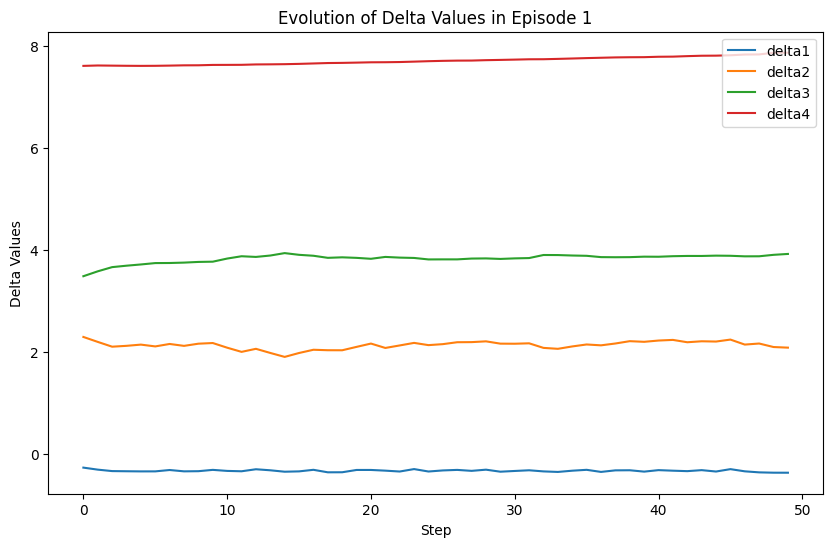

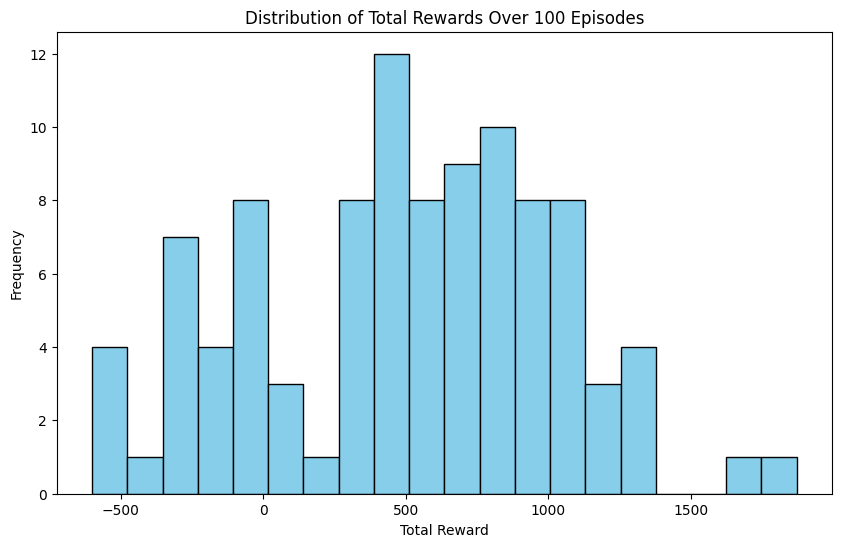

In [235]:
import gym
from stable_baselines3 import SAC
import json
import matplotlib.pyplot as plt
import numpy as np

# Define the enhanced convert_numpy function
def convert_numpy(obj):
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, (np.float16, np.float32, np.float64)):
        return float(obj)
    elif isinstance(obj, (np.int8, np.int16, np.int32, np.int64)):
        return int(obj)
    elif isinstance(obj, (np.bool_)):
        return bool(obj)
    else:
        raise TypeError(f"Object of type {type(obj)} is not JSON serializable")

# Define a validation function (optional)
def validate_serializable(obj):
    if isinstance(obj, dict):
        return all(validate_serializable(v) for v in obj.values())
    elif isinstance(obj, list):
        return all(validate_serializable(item) for item in obj)
    elif isinstance(obj, (str, int, float, bool, type(None))):
        return True
    elif isinstance(obj, (np.ndarray, np.float16, np.float32, np.float64,
                          np.int8, np.int16, np.int32, np.int64, np.bool_)):
        return True
    else:
        return False

# Initialize the environment for 4 states with 2 states contributing to the reward
env = StandardDeviationEnv(
    n_states=4,                   # Number of states
    n_states_rew=2,               # Number of states to include in the reward
    impr_coeff=100,               # Improvement coefficient
    min_d=[-1.0, 1.5, 3.1, 7.0],  # Minimum bounds for d1, d2, d3, d4
    max_d=[-0.1, 2.5, 4.0, 8.0],   # Maximum bounds for d1, d2, d3, d4
    
)



# Number of evaluation episodes
num_episodes = 100  # You can increase this number to record multiple episodes

# Initialize a list to store trajectories
trajectories = []

for episode in range(num_episodes):
    observation = env.reset()
    done = False
    # Initialize trajectory with all four deltas and rewards
    trajectory = {
        'delta1': [],
        'delta2': [],
        'delta3': [],
        'delta4': [],
        'C1_mean': [],
        'C2_mean': [],
        'std_over_mean_sum': [],
        'reward': []
    }
    total_reward = 0.0
    while not done:
        # Extract deltas and C means from the observation
        deltas = observation[:env.n_states]  # d1, d2, d3, d4
        C_means = observation[env.n_states:env.n_states + env.n_states_rew]  # C1_mean, C2_mean
        std_over_mean_sum = observation[-1]  # std_over_mean_sum

        # Append to trajectory
        trajectory['delta1'].append(deltas[0])
        trajectory['delta2'].append(deltas[1])
        trajectory['delta3'].append(deltas[2])
        trajectory['delta4'].append(deltas[3])
        trajectory['C1_mean'].append(C_means[0])
        trajectory['C2_mean'].append(C_means[1])
        trajectory['std_over_mean_sum'].append(std_over_mean_sum)
        trajectory['reward'].append(0.0)  # Placeholder for the reward

        # Agent selects action
        action, _ = model.predict(observation, deterministic=True)

        # Environment steps
        observation, reward, done, info = env.step(action)
        total_reward += reward

        # Update the last reward in trajectory
        trajectory['reward'][-1] = reward

    trajectories.append(trajectory)
    print(f"Episode {episode + 1} finished with total reward: {total_reward}")

# Optional: Validate all trajectories are serializable
for idx, traj in enumerate(trajectories):
    if not validate_serializable(traj):
        print(f"Trajectory {idx + 1} contains non-serializable objects.")
        # Handle the issue as needed

# Save trajectories to a JSON file
with open('trajectories_nrew2.json', 'w') as f:
    json.dump(trajectories, f, default=convert_numpy)

# Example: Plot deltas over steps for the first episode
plt.figure(figsize=(10, 6))
plt.plot(trajectories[0]['delta1'], label='delta1')
plt.plot(trajectories[0]['delta2'], label='delta2')
plt.plot(trajectories[0]['delta3'], label='delta3')
plt.plot(trajectories[0]['delta4'], label='delta4')
plt.xlabel('Step')
plt.ylabel('Delta Values')
plt.title('Evolution of Delta Values in Episode 1')
plt.legend()
plt.show()

# Example: Plot distribution of total rewards
total_rewards = [np.sum(traj['reward']) for traj in trajectories]
plt.figure(figsize=(10, 6))
plt.hist(total_rewards, bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Total Reward')
plt.ylabel('Frequency')
plt.title('Distribution of Total Rewards Over 100 Episodes')
plt.show()


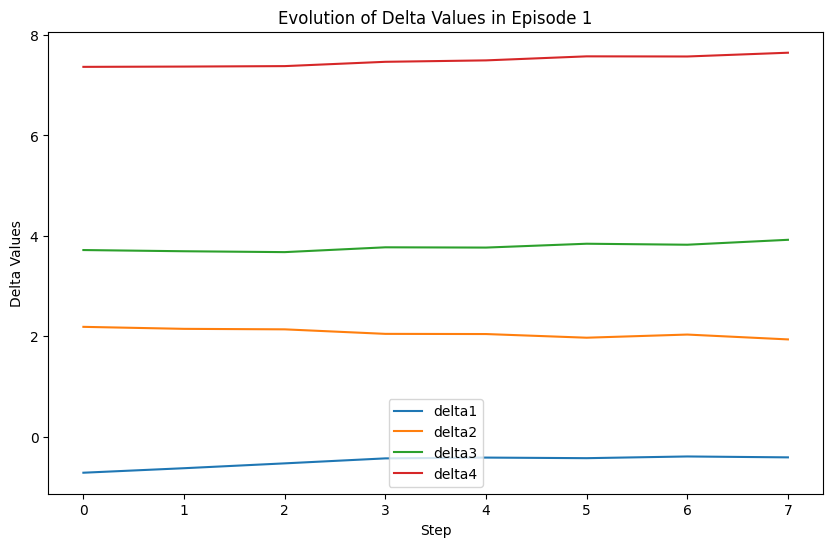

In [293]:
# Example: Plot deltas over steps for the first episode
plt.figure(figsize=(10, 6))
plt.plot(trajectories[1]['delta1'], label='delta1')
plt.plot(trajectories[1]['delta2'], label='delta2')
plt.plot(trajectories[1]['delta3'], label='delta3')
plt.plot(trajectories[1]['delta4'], label='delta4')
plt.xlabel('Step')
plt.ylabel('Delta Values')
plt.title('Evolution of Delta Values in Episode 1')
plt.legend()
plt.show()

In [274]:
trajectories[0]

{'delta1': [-0.27129170298576355,
  -0.31087246537208557,
  -0.33933326601982117,
  -0.34257733821868896,
  -0.3453855812549591,
  -0.3449116349220276,
  -0.31822651624679565,
  -0.3443053066730499,
  -0.34134313464164734,
  -0.31545087695121765,
  -0.33576008677482605,
  -0.34291738271713257,
  -0.30332598090171814,
  -0.3237309455871582,
  -0.3515465259552002,
  -0.3450013995170593,
  -0.3142392337322235,
  -0.3632819354534149,
  -0.3622448444366455,
  -0.31721073389053345,
  -0.31713059544563293,
  -0.3307268023490906,
  -0.34773778915405273,
  -0.30005985498428345,
  -0.3475905656814575,
  -0.32649141550064087,
  -0.3160499930381775,
  -0.33478209376335144,
  -0.31155723333358765,
  -0.35125264525413513,
  -0.3369094729423523,
  -0.32355111837387085,
  -0.3453807532787323,
  -0.3559409976005554,
  -0.33172211050987244,
  -0.31440410017967224,
  -0.35552144050598145,
  -0.32498541474342346,
  -0.3230733871459961,
  -0.3498254716396332,
  -0.3206038177013397,
  -0.3315202295780182,
 

In [291]:
# Define the unwanted end reward
unwanted_end_reward =0

# Initialize a list to store filtered trajectories
filtered_trajectories = []

# Iterate over all trajectories
for traj in trajectories:
    # Get the last reward in the trajectory
    last_reward = traj['reward'][-1]
    
    # Check if the last reward is not equal to the unwanted end reward
    if last_reward > unwanted_end_reward:
        filtered_trajectories.append(traj)

print(f"Filtered Trajectories (Excluding End Reward = {unwanted_end_reward}): {len(filtered_trajectories)}")


Filtered Trajectories (Excluding End Reward = 0): 19


In [289]:
filtered_trajectories[5]['reward'][-1]

-90.5189436982376

In [292]:
print((np.mean(np.array([tr['delta1'][-1] for tr in filtered_trajectories])),np.std(np.array([tr['delta1'][-1] for tr in filtered_trajectories]))),(np.mean(np.array([tr['delta2'][-1] for tr in filtered_trajectories])),np.std(np.array([tr['delta2'][-1] for tr in filtered_trajectories]))),(np.mean(np.array([tr['delta3'][-1] for tr in filtered_trajectories])),np.std(np.array([tr['delta3'][-1] for tr in filtered_trajectories]))),(np.mean(np.array([tr['delta4'][-1] for tr in filtered_trajectories])),np.std(np.array([tr['delta4'][-1] for tr in filtered_trajectories]))))

(-0.32554988484633596, 0.023447969797070124) (2.0644104794452063, 0.1118491488593021) (3.794046740782888, 0.10382703403045003) (7.58795334163465, 0.22283774111691815)


(1.9210341, 0.19817173)

(3.8320577, 0.16996355)

(7.65109, 0.2771882)

In [ ]:
(-0.4006335, 0.089132264)

(-0.39129412, 0.05404941)

In [ ]:
env.compute_reward()

In [214]:
# Reset the environment to get the initial observation
initial_obs = env.reset()
print(f"Initial Observation Shape: {initial_obs.shape}")  # Expected: (4 + 2 + 1,) = (7,)
print(f"Initial Observation: {initial_obs}")
print(f"Observation Space Shape: {env.observation_space.shape}")  # Expected: (7,)
assert initial_obs.shape == env.observation_space.shape, "Observation shape does not match observation space."


Initial Observation Shape: (7,)
Initial Observation: [ 0.7309575  2.0547457  3.5181472  7.632567  -0.4618672 -0.0546774
  3.3931787]
Observation Space Shape: (7,)


In [246]:
def plot_trajectories_over_landscape(env, trajectories, fixed_deltas, plane=('delta1', 'delta2'), num_traj=10, cmap='viridis', levels=np.linspace(-10, 20, 100)):
    """
    Plots specified trajectories over a reward landscape in a given 2D plane.
    
    Args:
        env (StandardDeviationEnv): The environment instance.
        trajectories (list): List of trajectory dictionaries.
        fixed_deltas (dict): Fixed values for deltas not being plotted.
        plane (tuple): Pair of deltas to plot (e.g., ('delta1', 'delta2')).
        num_traj (int): Number of trajectories to plot.
        cmap (str): Colormap for the reward landscape.
        levels (array-like): Contour levels.
    """
    delta_x, delta_y = plane
    # Map delta labels to indices
    delta_indices = {'delta1': 0, 'delta2': 1, 'delta3': 2, 'delta4': 3}
    x_idx = delta_indices[delta_x]
    y_idx = delta_indices[delta_y]
    
    # Get min and max for the plane
    x_min, x_max = env.min_d[x_idx], env.max_d[x_idx]
    y_min, y_max = env.min_d[y_idx], env.max_d[y_idx]
    
    # Create grid
    num_points = 100
    x_values = np.linspace(x_min, x_max, num_points)
    y_values = np.linspace(y_min, y_max, num_points)
    x_grid, y_grid = np.meshgrid(x_values, y_values)
    
    # Initialize reward grid
    reward_grid = np.zeros_like(x_grid)
    
    # Compute reward for each grid point
    for i in range(num_points):
        for j in range(num_points):
            # Start with fixed deltas
            d_values = [0.0] * env.n_states  # Placeholder
            # Assign fixed deltas
            for key, value in fixed_deltas.items():
                d_values[delta_indices[key]] = value
            # Assign varying deltas
            d_values[x_idx] = x_grid[i, j]
            d_values[y_idx] = y_grid[i, j]
            try:
                reward = env.compute_reward(d_values)
                reward_grid[i, j] = reward
            except:
                reward_grid[i, j] = np.nan  # Assign NaN to problematic points
    
    # Mask NaN values for plotting
    masked_reward = np.ma.masked_where(np.isnan(reward_grid), reward_grid)
    
    # Create the plot
    plt.figure(figsize=(12, 8))
    contour = plt.contourf(x_grid, y_grid, masked_reward, levels=levels, cmap=cmap)
    plt.colorbar(contour, label='Immediate Reward')
    
    # Plot trajectories
    selected_trajectories = trajectories[:num_traj]
    for idx, traj in enumerate(selected_trajectories):
        x_traj = traj[delta_x]
        y_traj = traj[delta_y]
        plt.plot(x_traj, y_traj, linestyle='-', linewidth=1, alpha=0.7, label=f'Trajectory {idx + 1}')
        # Mark start and end points
        plt.scatter(x_traj[0], y_traj[0], color='green', s=50, marker='o', label='Start' if idx == 0 else "")
        plt.scatter(x_traj[-1], y_traj[-1], color='black', s=50, marker='X', label='End' if idx == 0 else "")
    
    # Labeling
    plt.xlabel(rf'$\Delta_{{{delta_x[-1]}}}$', fontsize=14)
    plt.ylabel(rf'$\Delta_{{{delta_y[-1]}}}$', fontsize=14)
    plt.title(f'Agent Trajectories over Reward Landscape in {delta_x}-{delta_y} Plane', fontsize=16)
    
    # Optional: Add a legend
    plt.legend()
    
    plt.grid(True)
    plt.show()


In [ ]:
plot_trajectories_over_landscape(env, trajectories, fixed_deltas, plane=('delta1', 'delta2'), num_traj=10, cmap='viridis', levels=np.linspace(-10, 20, 100))

In [296]:
delta1_min

delta1_max

-0.1

In [ ]:
num_points = 100  # Grid resolution

delta1_values = np.linspace(delta1_min, delta1_max, num_points)
delta2_values = np.linspace(delta2_min, delta2_max, num_points)

Loaded 100 trajectories.
Fixed Δ3: 3.53814222574234, Fixed Δ4: 7.4817212247848515


/var/folders/n_/wc4mh9w578z14yty8h6vvbph0000gn/T/ipykernel_46630/2992655723.py:136: RuntimeWarning: invalid value encountered in scalar multiply
  term1 = (z ** h) * (z_conj ** hb) * hg_h_z * hg_hb_z_conj
/var/folders/n_/wc4mh9w578z14yty8h6vvbph0000gn/T/ipykernel_46630/2992655723.py:137: RuntimeWarning: invalid value encountered in scalar multiply
  term2 = (z_conj ** h) * (z ** hb) * hg_h_z_conj * hg_hb_z


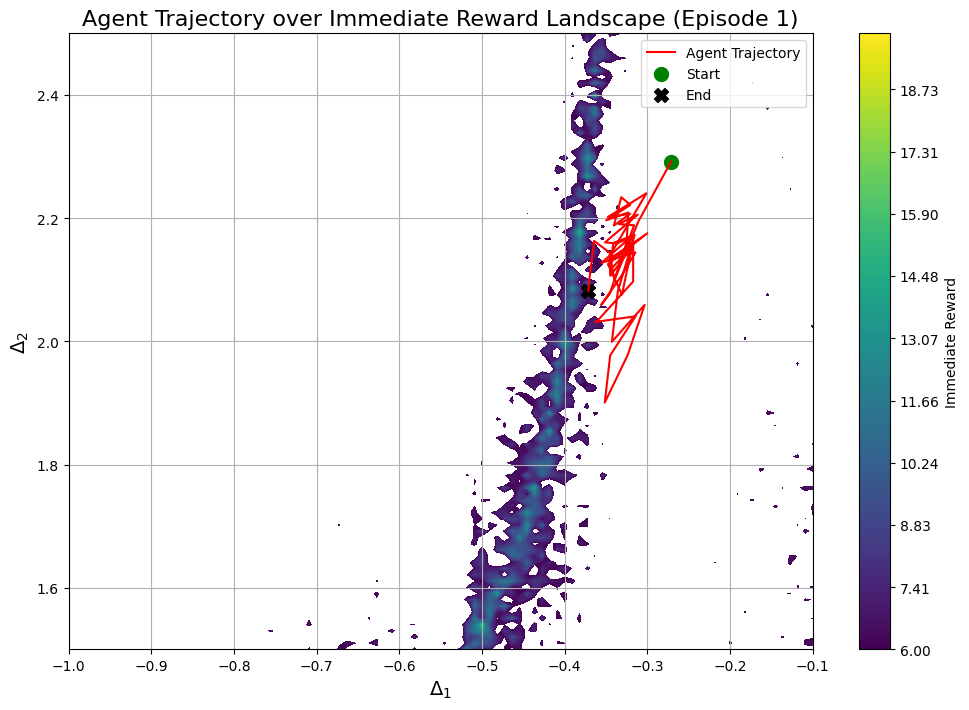

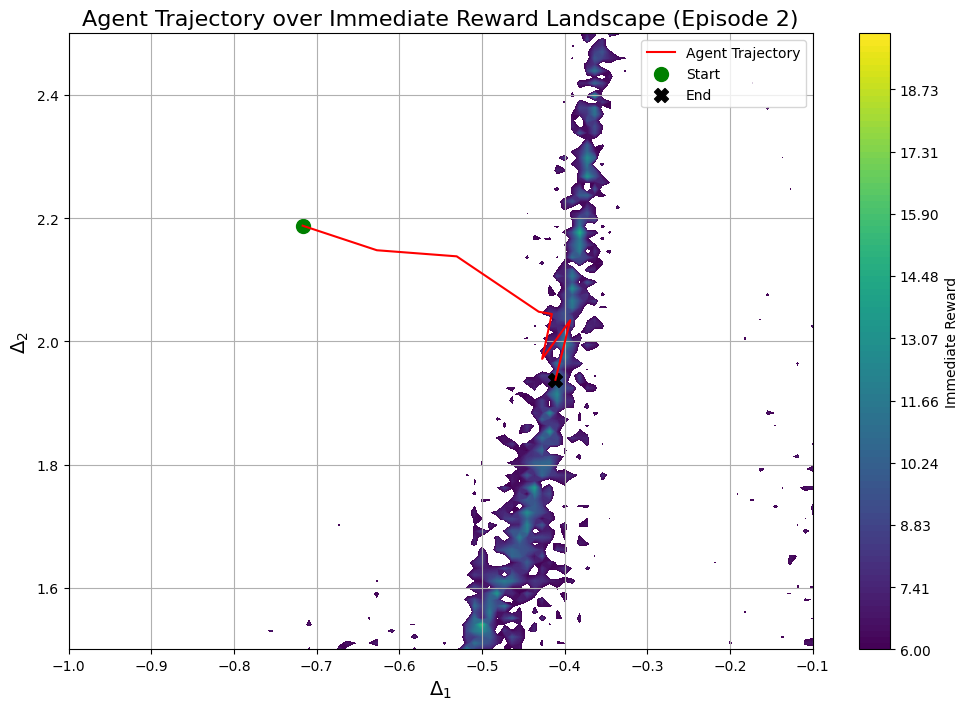

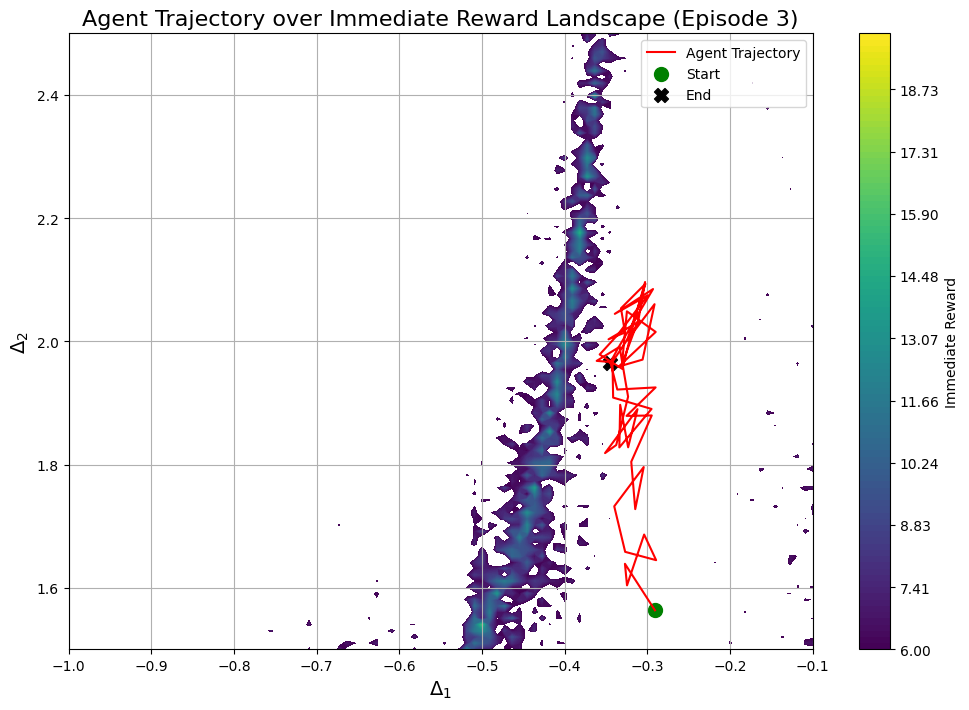

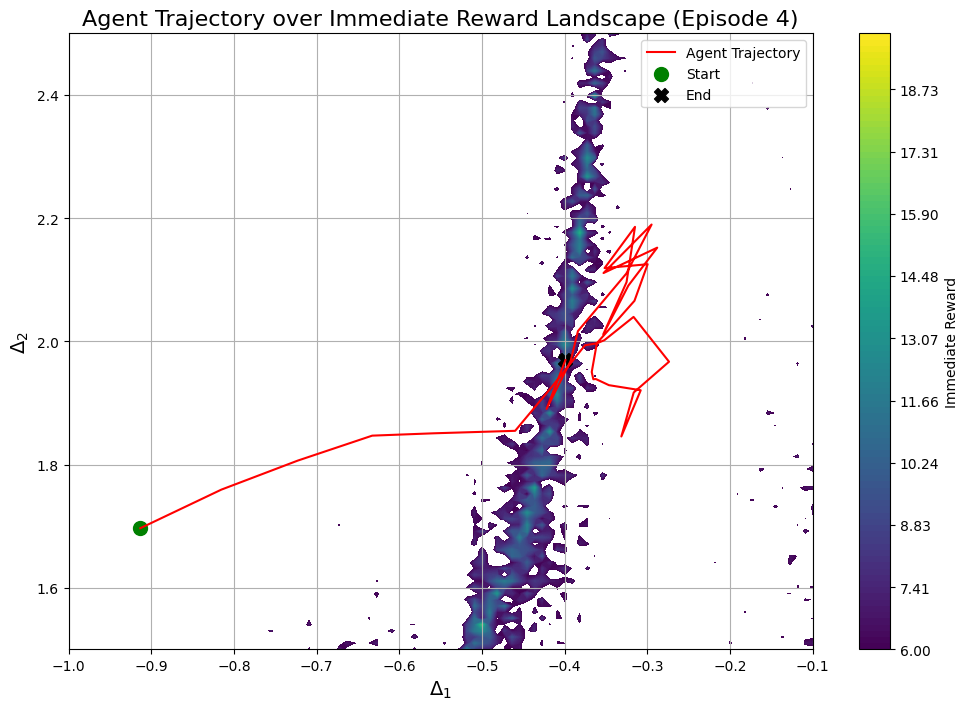

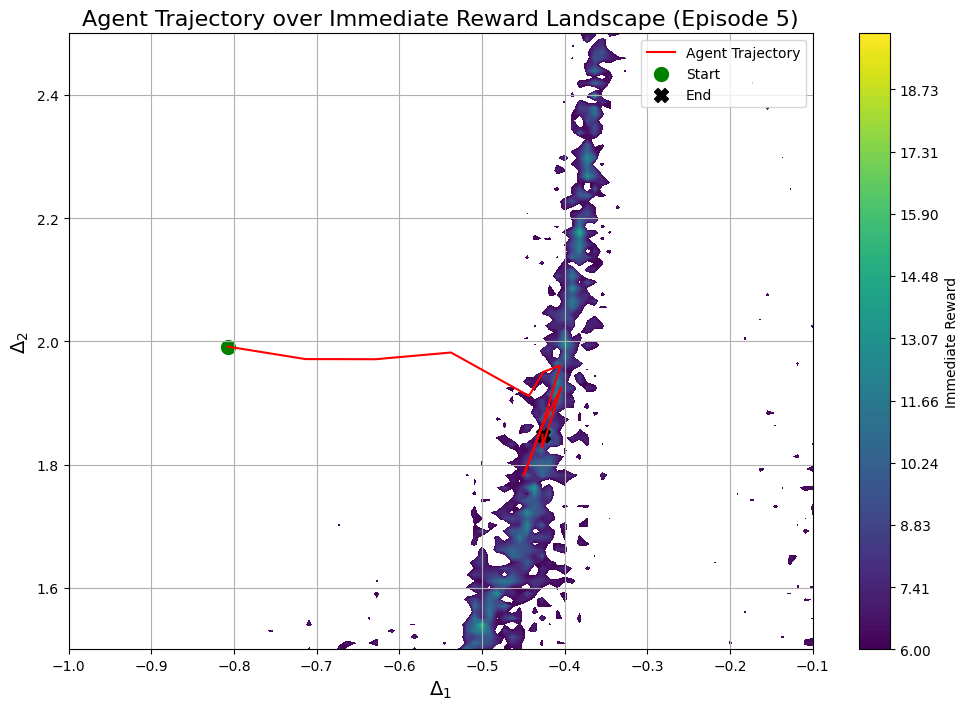

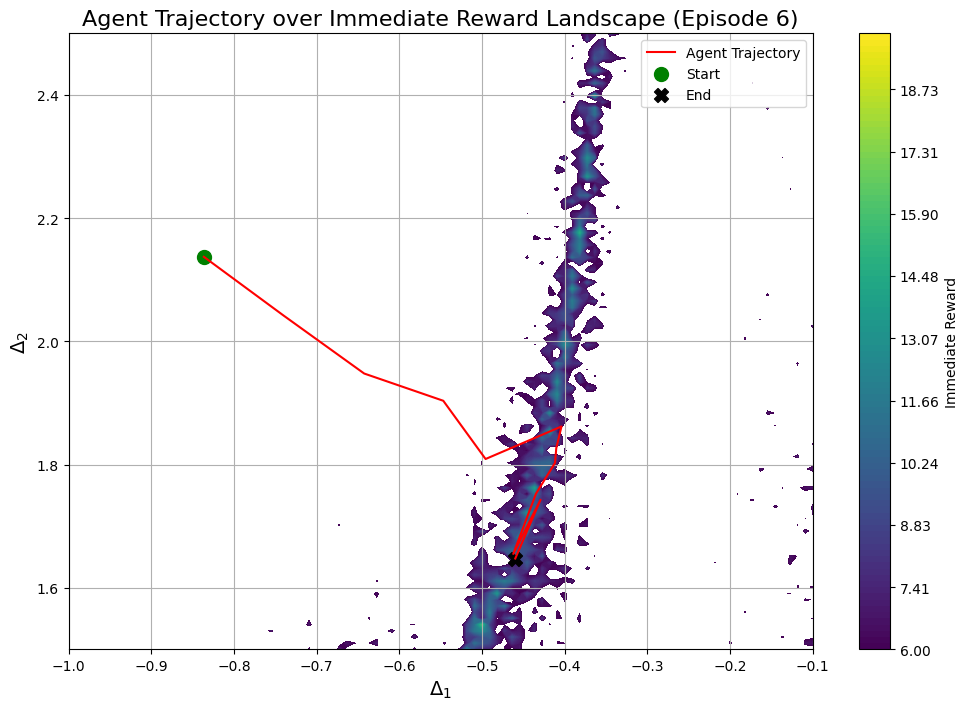

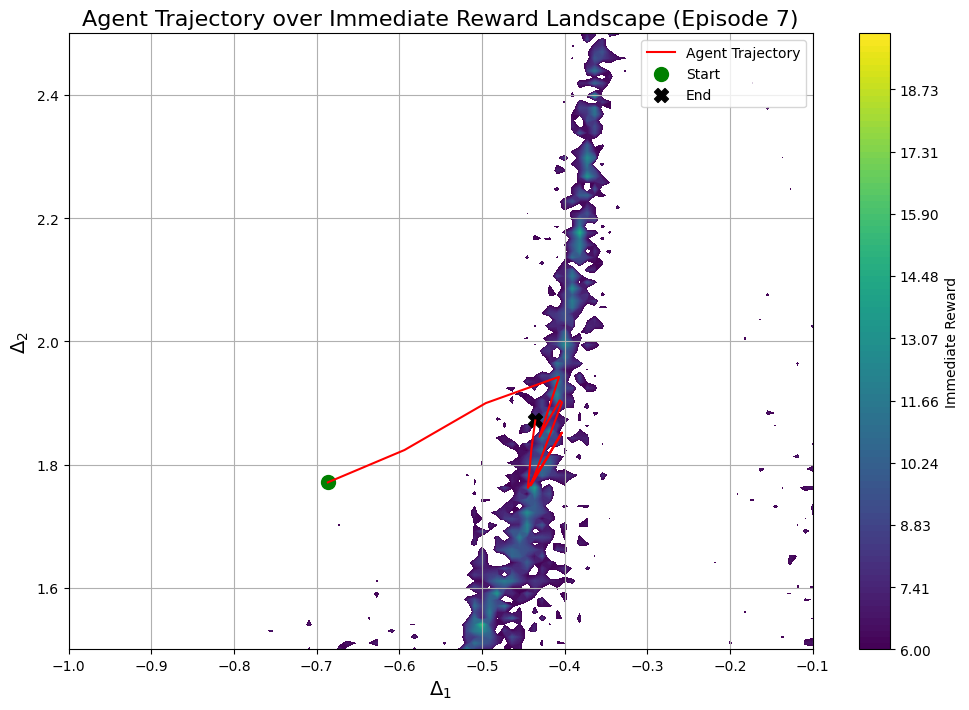

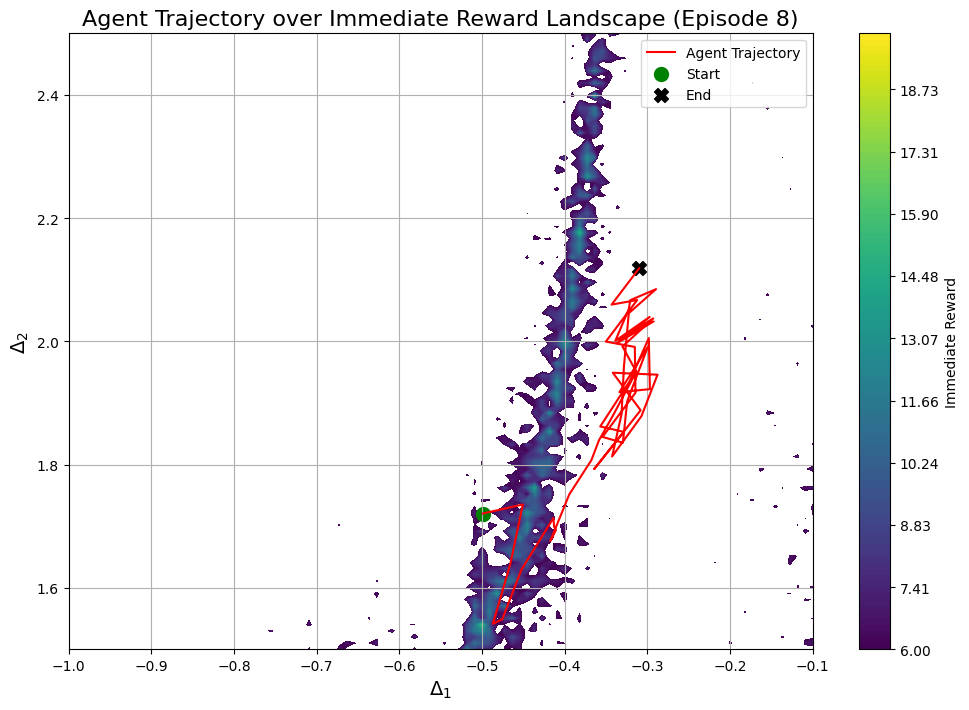

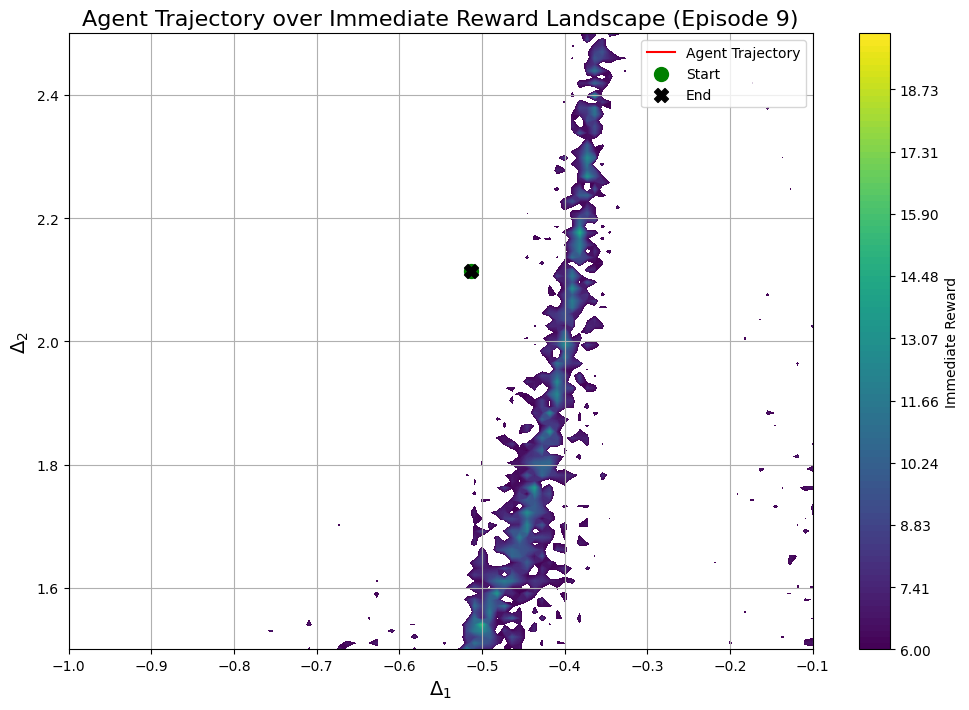

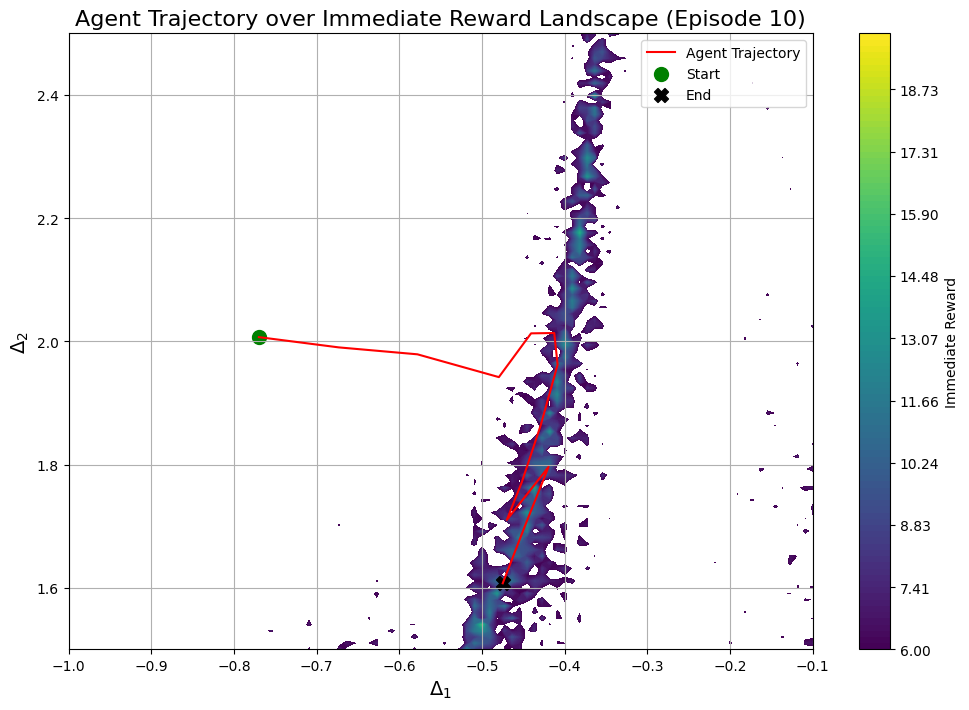

In [294]:
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

# Define the enhanced convert_numpy function
def convert_numpy(obj):
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, (np.float16, np.float32, np.float64)):
        return float(obj)
    elif isinstance(obj, (np.int8, np.int16, np.int32, np.int64)):
        return int(obj)
    elif isinstance(obj, (np.bool_)):
        return bool(obj)
    else:
        raise TypeError(f"Object of type {type(obj)} is not JSON serializable")

# Load trajectories from the JSON file
with open('trajectories_nrew2.json', 'r') as f:
    trajectories = json.load(f)

print(f"Loaded {len(trajectories)} trajectories.")



# Define fixed values for Δ3 and Δ4 (e.g., average from trajectories)
all_d3 = [traj['delta3'][0] for traj in trajectories]
all_d4 = [traj['delta4'][0] for traj in trajectories]
fixed_d3 = np.mean(all_d3)
fixed_d4 = np.mean(all_d4)
print(f"Fixed Δ3: {fixed_d3}, Fixed Δ4: {fixed_d4}")

# Create a grid over Δ1 and Δ2
delta1_min, delta1_max = env.min_d[0], env.max_d[0]
delta2_min, delta2_max = env.min_d[1], env.max_d[1]
num_points = 100  # Grid resolution

delta1_values = np.linspace(delta1_min, delta1_max, num_points)
delta2_values = np.linspace(delta2_min, delta2_max, num_points)
delta1_grid, delta2_grid = np.meshgrid(delta1_values, delta2_values)

# Initialize the reward grid
reward_grid = np.zeros_like(delta1_grid)

# Compute the reward for each (Δ1, Δ2) pair with fixed Δ3 and Δ4
for i in range(num_points):
    for j in range(num_points):
        d1 = delta1_grid[i, j]
        d2 = delta2_grid[i, j]
        d_values = [d1, d2, fixed_d3, fixed_d4]
        try:
            reward = env.compute_reward(d_values)
            reward_grid[i, j] = reward
        except Exception as e:
            # Assign NaN or a default low reward for invalid points
            reward_grid[i, j] = np.nan
            print(f"Reward computation failed at Δ1={d1:.2f}, Δ2={d2:.2f}: {e}")

# Define the number of trajectories to plot
num_traj_to_plot = 10  # Adjust as needed

# Select a subset of trajectories to plot
selected_trajectories = trajectories[:num_traj_to_plot]

# Plot each trajectory over the reward landscape
for idx, traj in enumerate(selected_trajectories):
    plt.figure(figsize=(12, 8))
    
    # Plot the reward landscape
    contour = plt.contourf(delta1_grid, delta2_grid, reward_grid, levels=np.linspace(6, 20, 100), cmap='viridis')
    plt.colorbar(contour, label='Immediate Reward')
    
    # Plot the agent's trajectory
    plt.plot(traj['delta1'], traj['delta2'], linestyle='-', color='red', label='Agent Trajectory')
    
    # Mark the initial point
    plt.scatter(traj['delta1'][0], traj['delta2'][0], color='green', s=100, marker='o', label='Start')
    
    # Mark the final point
    plt.scatter(traj['delta1'][-1], traj['delta2'][-1], color='black', s=100, marker='X', label='End')
    
    # Labeling
    plt.xlabel(r'$\Delta_1$', fontsize=14)
    plt.ylabel(r'$\Delta_2$', fontsize=14)
    plt.title(f'Agent Trajectory over Immediate Reward Landscape (Episode {idx + 1})', fontsize=16)
    
    # Legend and grid
    plt.legend()
    plt.grid(True)
    
    # Show the plot
    plt.show()


/var/folders/n_/wc4mh9w578z14yty8h6vvbph0000gn/T/ipykernel_46630/2992655723.py:136: RuntimeWarning: invalid value encountered in scalar multiply
  term1 = (z ** h) * (z_conj ** hb) * hg_h_z * hg_hb_z_conj
/var/folders/n_/wc4mh9w578z14yty8h6vvbph0000gn/T/ipykernel_46630/2992655723.py:137: RuntimeWarning: invalid value encountered in scalar multiply
  term2 = (z_conj ** h) * (z ** hb) * hg_h_z_conj * hg_hb_z


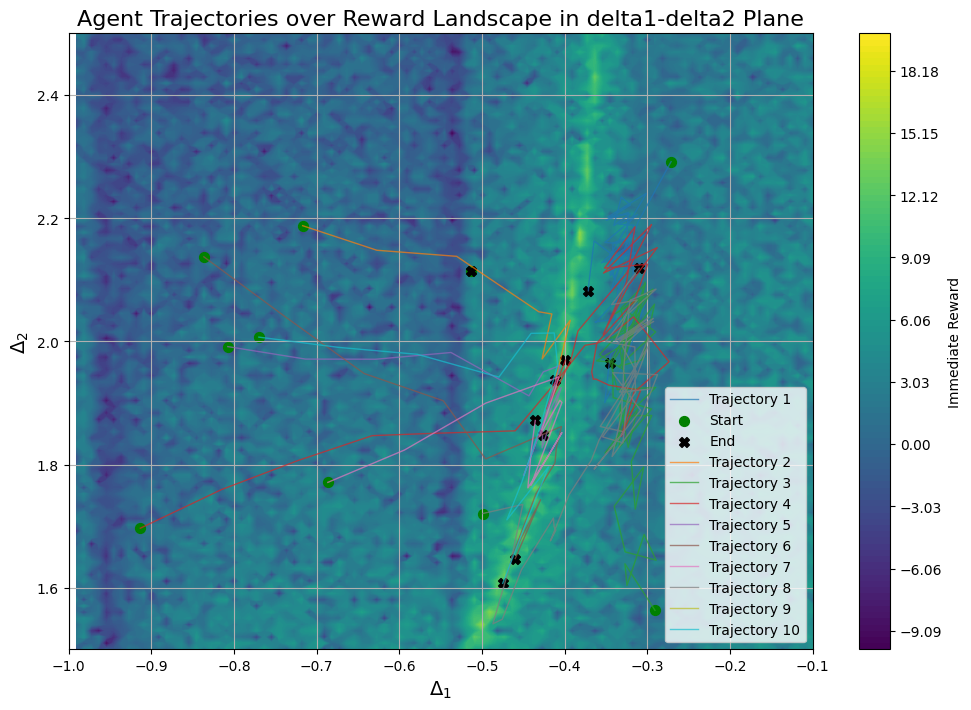

In [247]:
fixed_deltas = {'delta3': fixed_d3, 'delta4': fixed_d4}

# Plot in Δ1-Δ2 plane
plot_trajectories_over_landscape(
    env=env,
    trajectories=trajectories,
    fixed_deltas=fixed_deltas,
    plane=('delta1', 'delta2'),
    num_traj=10,        # Number of trajectories to plot
    cmap='viridis',
    levels=np.linspace(-10, 20, 100)
)

In [256]:
env = StandardDeviationEnv(
    n_states=4,                   # Number of states
    n_states_rew=2,               # Number of states to include in the reward
    impr_coeff=100,               # Improvement coefficient
    min_d=[-1.0, 1.5, 3.1, 7.0],  # Minimum bounds for d1, d2, d3, d4
    max_d=[-0.1, 2.5, 4.0, 8.0],   # Maximum bounds for d1, d2, d3, d4
    
)

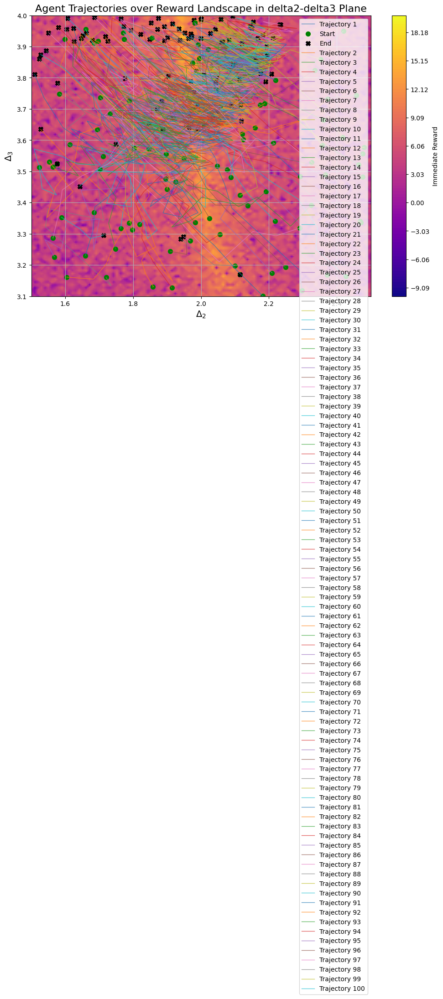

In [257]:
# Define fixed deltas (Δ1 and Δ4)
fixed_deltas = {'delta1': fixed_d1, 'delta4': fixed_d4}

# Plot in Δ2-Δ3 plane
plot_trajectories_over_landscape(
    env=env,
    trajectories=trajectories,
    fixed_deltas=fixed_deltas,
    plane=('delta2', 'delta3'),
    num_traj=100,
    cmap='plasma',
    levels=np.linspace(-10, 20, 100)
)


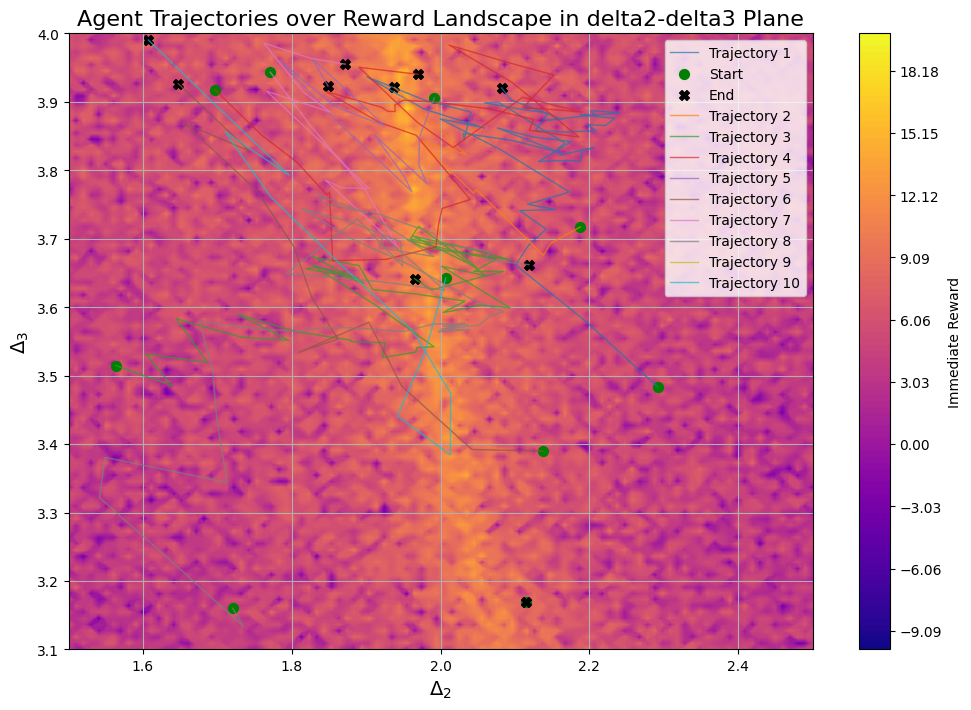

In [249]:
# Define fixed deltas (Δ1 and Δ4)
fixed_deltas = {'delta1': fixed_d1, 'delta4': fixed_d4}

# Plot in Δ2-Δ3 plane
plot_trajectories_over_landscape(
    env=env,
    trajectories=trajectories,
    fixed_deltas=fixed_deltas,
    plane=('delta2', 'delta3'),
    num_traj=10,
    cmap='plasma',
    levels=np.linspace(-10, 20, 100)
)


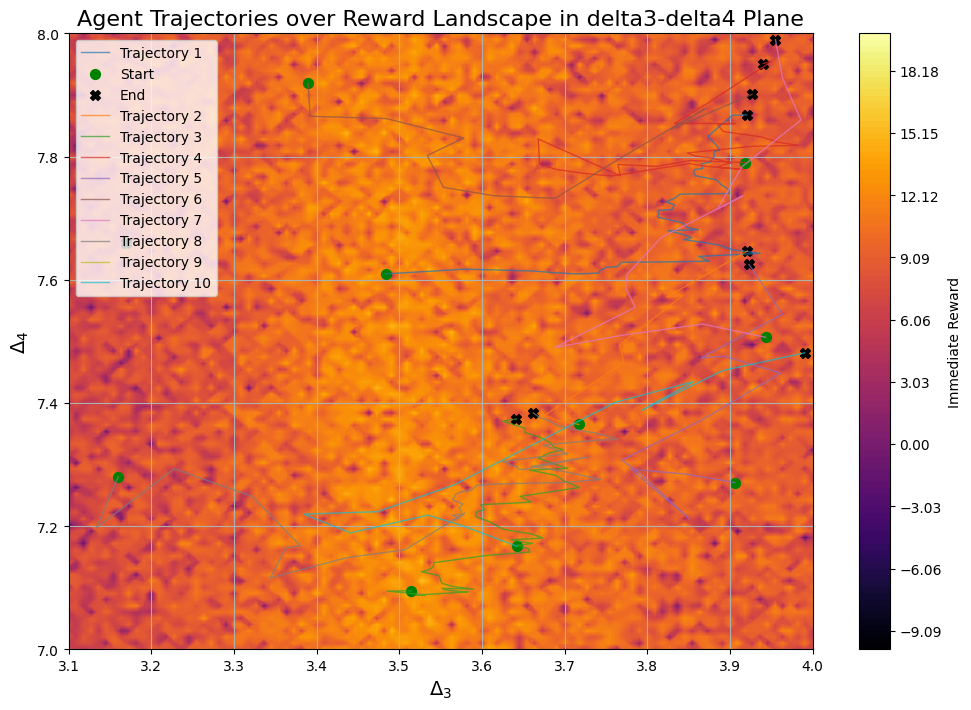

In [253]:
# Define fixed deltas (Δ1 and Δ2)
fixed_deltas = {'delta1': fixed_d1, 'delta2': 2.0}

# Plot in Δ3-Δ4 plane
plot_trajectories_over_landscape(
    env=env,
    trajectories=trajectories,
    fixed_deltas=fixed_deltas,
    plane=('delta3', 'delta4'),
    num_traj=10,
    cmap='inferno',
    levels=np.linspace(-10, 20, 100)
)


In [258]:
# Initialize variables to track the best reward and corresponding deltas
best_reward = -np.inf  # Start with negative infinity
best_deltas = {}        # To store deltas corresponding to the best reward
best_trajectory_idx = -1  # To identify which trajectory
best_step_idx = -1        # To identify which step within the trajectory


In [259]:
# Iterate over all trajectories
for traj_idx, traj in enumerate(trajectories):
    # Iterate over all steps in the trajectory
    for step_idx in range(len(traj['reward'])):
        current_reward = traj['reward'][step_idx]
        
        # Check if the current reward is better than the best found so far
        if current_reward > best_reward:
            best_reward = current_reward
            best_deltas = {
                'delta1': traj['delta1'][step_idx],
                'delta2': traj['delta2'][step_idx],
                'delta3': traj['delta3'][step_idx],
                'delta4': traj['delta4'][step_idx]
            }
            best_trajectory_idx = traj_idx
            best_step_idx = step_idx


In [260]:
# Find all steps with the best_reward
optimal_points = []

for traj_idx, traj in enumerate(trajectories):
    for step_idx in range(len(traj['reward'])):
        if traj['reward'][step_idx] == best_reward:
            optimal_points.append({
                'trajectory_index': traj_idx,
                'step_index': step_idx,
                'deltas': {
                    'delta1': traj['delta1'][step_idx],
                    'delta2': traj['delta2'][step_idx],
                    'delta3': traj['delta3'][step_idx],
                    'delta4': traj['delta4'][step_idx]
                }
            })


In [261]:
print(f"Best Reward Achieved: {best_reward}")
print(f"Corresponding Deltas at Trajectory {best_trajectory_idx + 1}, Step {best_step_idx + 1}:")
print(f"Δ1: {best_deltas['delta1']}")
print(f"Δ2: {best_deltas['delta2']}")
print(f"Δ3: {best_deltas['delta3']}")
print(f"Δ4: {best_deltas['delta4']}")


Best Reward Achieved: 1470.7715922402438
Corresponding Deltas at Trajectory 27, Step 6:
Δ1: -0.5299291610717773
Δ2: 1.9137884378433228
Δ3: 3.3682453632354736
Δ4: 7.221731185913086


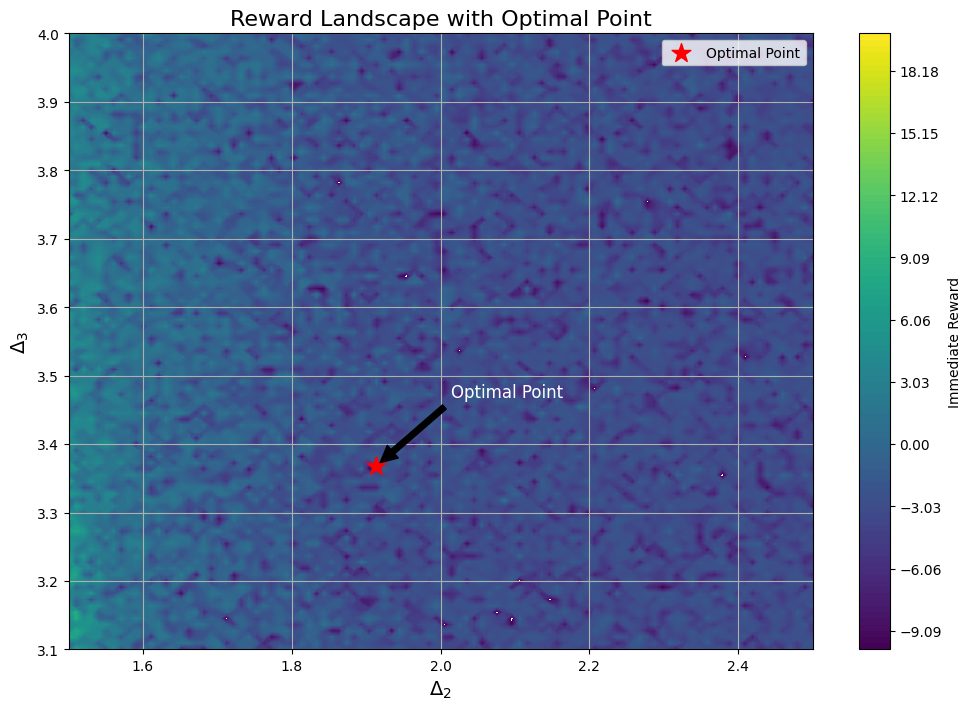

In [263]:
# Define the range and resolution for Δ2 and Δ3
delta2_min, delta2_max = env.min_d[1], env.max_d[1]
delta3_min, delta3_max = env.min_d[2], env.max_d[2]
num_points = 100  # Grid resolution

# Create linearly spaced values for Δ2 and Δ3
delta2_values = np.linspace(delta2_min, delta2_max, num_points)
delta3_values = np.linspace(delta3_min, delta3_max, num_points)

# Create a mesh grid for Δ2 and Δ3
delta2_grid, delta3_grid = np.meshgrid(delta2_values, delta3_values)

# Fixed Δ1 and Δ4 based on the optimal point
fixed_d1 = best_deltas['delta1']
fixed_d4 = best_deltas['delta4']

# Initialize the reward grid
reward_grid = np.zeros_like(delta2_grid)

# Compute the reward for each (Δ2, Δ3) pair with fixed Δ1 and Δ4
for i in range(num_points):
    for j in range(num_points):
        d2 = delta2_grid[i, j]
        d3 = delta3_grid[i, j]
        d_values = [fixed_d1, d2, d3, fixed_d4]
        try:
            reward = env.compute_reward(d_values)
            reward_grid[i, j] = reward
        except Exception as e:
            # Assign NaN or a default low reward for invalid points
            reward_grid[i, j] = np.nan
            print(f"Reward computation failed at Δ2={d2:.2f}, Δ3={d3:.2f}: {e}")

plt.figure(figsize=(12, 8))

# Plot the reward landscape using contourf
contour = plt.contourf(delta2_grid, delta3_grid, reward_grid, levels=np.linspace(-10, 20, 100), cmap='viridis')
plt.colorbar(contour, label='Immediate Reward')

# Plot the optimal point
plt.scatter(best_deltas['delta2'], best_deltas['delta3'], color='red', s=200, marker='*', label='Optimal Point')

# Highlight the optimal point with annotations
plt.annotate('Optimal Point', 
             xy=(best_deltas['delta2'], best_deltas['delta3']),
             xytext=(best_deltas['delta2'] + 0.1, best_deltas['delta3'] + 0.1),
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=12,
             color='white')

# Labeling
plt.xlabel(r'$\Delta_2$', fontsize=14)
plt.ylabel(r'$\Delta_3$', fontsize=14)
plt.title('Reward Landscape with Optimal Point', fontsize=16)

# Add legend
plt.legend()

# Add grid
plt.grid(True)

# Show the plot
plt.show()


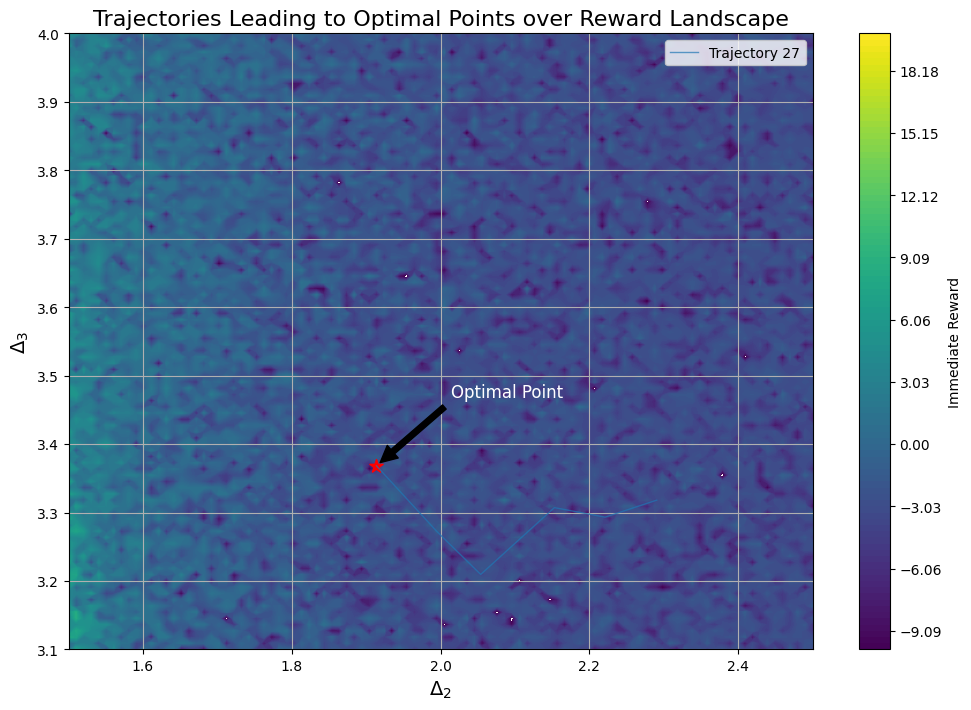

In [264]:
plt.figure(figsize=(12, 8))

# Plot the reward landscape
contour = plt.contourf(delta2_grid, delta3_grid, reward_grid, levels=np.linspace(-10, 20, 100), cmap='viridis')
plt.colorbar(contour, label='Immediate Reward')

# Plot each optimal trajectory
for point in optimal_points:
    traj_idx = point['trajectory_index']
    step_idx = point['step_index']
    traj = trajectories[traj_idx]
    # Plot up to the optimal step
    plt.plot(traj['delta2'][:step_idx + 1], traj['delta3'][:step_idx + 1], 
             linestyle='-', linewidth=1, alpha=0.7, label=f'Trajectory {traj_idx + 1}' if point == optimal_points[0] else "")
    # Mark the optimal point
    plt.scatter(traj['delta2'][step_idx], traj['delta3'][step_idx], color='red', s=100, marker='*')

# Annotate the first optimal point
if optimal_points:
    first_opt = optimal_points[0]
    plt.annotate('Optimal Point', 
                 xy=(first_opt['deltas']['delta2'], first_opt['deltas']['delta3']),
                 xytext=(first_opt['deltas']['delta2'] + 0.1, first_opt['deltas']['delta3'] + 0.1),
                 arrowprops=dict(facecolor='black', shrink=0.05),
                 fontsize=12,
                 color='white')

# Labeling
plt.xlabel(r'$\Delta_2$', fontsize=14)
plt.ylabel(r'$\Delta_3$', fontsize=14)
plt.title('Trajectories Leading to Optimal Points over Reward Landscape', fontsize=16)
plt.legend()
plt.grid(True)
plt.show()
